<div style="display: flex; flex-direction: column; justify-content: center; align-items: center; height: 100vh;margin-left:300px;margin-top:70px;">
    <div>
        <img src="https://cdn-icons-png.flaticon.com/512/8345/8345921.png" alt="Chatbot Image" width="100" />
    </div>
    <div style="color: #ff7f00; font-size: 60px;margin-bottom:110px; margin-top:2px; font-weight: bold;">
        Project Lab
    </div>
</div>


<div style="font-family: 'Segoe UI', Tahoma, sans-serif; line-height: 1.8; color: #2c3e50; padding: 30px; border: 1px solid #e0e0e0; border-radius: 12px; background-color: #f0f8ff; max-width: 1050px; margin: 20px auto; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">

  <h2 style="text-align: center; color: #2980b9; margin-bottom: 20px;">📊 Apprentissage Supervisé</h2>

  <p style="margin-bottom: 20px; font-size: 16px;">L'apprentissage supervisé se divise en deux grandes catégories : la régression et la classification.</p>

  <div style="margin-bottom: 20px;">
    <strong style="color: #2980b9;">🔹 Régression :</strong>  
    <span>Utilisée pour prédire des valeurs continues.</span>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #2980b9;">🔹 Classification :</strong>  
    <span>Utilisée pour prédire des catégories ou des classes.</span>
  </div>

  <h3 style="color: #16a085; margin-bottom: 15px;">🔍 Méthodes de Classification</h3>
  
  <div style="margin-bottom: 20px;">
    <strong style="color: #2c3e50;">✨ Méthodes Simples :</strong>
    <ul style="margin-top: 10px; padding-left: 20px;">
      <li><strong>K-Nearest Neighbors (KNN)</strong></li>
      <li><strong>Support Vector Machines (SVM)</strong></li>
      <li><strong>Decision Tree</strong></li>
    </ul>
  </div>

  <div>
    <strong style="color: #2c3e50;">✨ Méthodes d'Ensemble :</strong>
    <ul style="margin-top: 10px; padding-left: 20px;">
      <li><strong>Random Forest</strong></li>
      <li><strong>Boosting</strong></li>
    </ul>
  </div>

</div>


In [1]:
import pandas as pd  # Used for data manipulation and analysis
import numpy as np  # Provides support for numerical computations and array operations

import matplotlib.pyplot as plt  # Used for creating visualizations such as line charts, histograms, etc.
import seaborn as sns  # Provides advanced visualizations and easier styling for statistical data plots

from sklearn import tree  # Provides tools for working with decision trees, such as visualization and implementation

from sklearn.preprocessing import MinMaxScaler  # Scales features to a specific range (default: 0 to 1)
from sklearn.feature_selection import chi2, SelectKBest  # Used for feature selection based on statistical tests

from sklearn.linear_model import LogisticRegression  # Implements Logistic Regression, a simple linear model for classification
from sklearn.tree import DecisionTreeClassifier  # Implements Decision Tree Classifier for classification tasks
from sklearn.ensemble import RandomForestClassifier  # Implements Random Forest, an ensemble model based on decision trees
from sklearn.neighbors import KNeighborsClassifier  # Implements k-Nearest Neighbors for classification
from sklearn.svm import SVC  # Implements Support Vector Classifier for classification
from sklearn.ensemble import AdaBoostClassifier  # Implements AdaBoost, an ensemble model that uses boosting
from sklearn.ensemble import GradientBoostingClassifier  # Implements Gradient Boosting, another ensemble boosting model
from xgboost import XGBClassifier  # Implements eXtreme Gradient Boosting, an optimized boosting algorithm

from sklearn.model_selection import train_test_split, GridSearchCV  # Splits data into training/testing and performs hyperparameter tuning

from imblearn.over_sampling import SMOTE  # Handles class imbalance by oversampling the minority class using SMOTE
from imblearn.combine import SMOTEENN  # Combines SMOTE and Edited Nearest Neighbors to balance data
from imblearn.combine import SMOTETomek  # Combines SMOTE and Tomek links for oversampling and cleaning

from sklearn.metrics import (  # Provides performance metrics for model evaluation
    accuracy_score,  # Calculates the accuracy of the predictions
    classification_report,  # Provides a detailed report of precision, recall, F1-score, etc.
    confusion_matrix,  # Generates a confusion matrix for classification evaluation
    roc_auc_score,  # Calculates the ROC-AUC score for binary classification tasks
    ConfusionMatrixDisplay  # Visualizes the confusion matrix
)
# ROC curve for both training and testing data
from sklearn.metrics import roc_curve, auc

import joblib  # Used for saving and loading trained models to/from disk
from IPython.display import FileLink  # Creates downloadable links for files in Jupyter/IPython notebooks


In [2]:
# Load the Dataset
df_train = pd.read_csv(r'C:\Users\moham\OneDrive\Bureau\churn-bigml-80.csv')  # Loading the training dataset
df_test = pd.read_csv(r'C:\Users\moham\OneDrive\Bureau\churn-bigml-20.csv')  # Loading the testing dataset

# Combine the training and testing datasets for preprocessing or unified analysis
df = pd.concat([df_train, df_test], axis=0, ignore_index=True)

# Dropping the 'State' column
df = df.drop(columns=['State'])

# Display the resulting dataframe
df

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,114,415,No,Yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False
3329,106,408,No,Yes,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1,False
3330,60,415,No,No,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3,False
3331,159,415,No,No,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1,False


<h1 style="color:red">I.Explore and Visualize the Dataset  </h1> 

<h2 style="color:green">1.Basic Exploration</h2>   

In [3]:
# show first lines
df.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [4]:
#show last lines
df.tail()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
3328,114,415,No,Yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False
3329,106,408,No,Yes,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1,False
3330,60,415,No,No,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3,False
3331,159,415,No,No,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1,False
3332,184,510,Yes,No,0,213.8,105,36.35,159.6,84,13.57,139.2,137,6.26,5.0,10,1.35,2,False


In [5]:
# descriptive statistics
df.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [6]:
# show data types and missing values
df.info()
print("Data types of each column:")
print(df.dtypes)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Account length          3333 non-null   int64  
 1   Area code               3333 non-null   int64  
 2   International plan      3333 non-null   object 
 3   Voice mail plan         3333 non-null   object 
 4   Number vmail messages   3333 non-null   int64  
 5   Total day minutes       3333 non-null   float64
 6   Total day calls         3333 non-null   int64  
 7   Total day charge        3333 non-null   float64
 8   Total eve minutes       3333 non-null   float64
 9   Total eve calls         3333 non-null   int64  
 10  Total eve charge        3333 non-null   float64
 11  Total night minutes     3333 non-null   float64
 12  Total night calls       3333 non-null   int64  
 13  Total night charge      3333 non-null   float64
 14  Total intl minutes      3333 non-null   

In [7]:
# Show numeric columns
numeric_columns=df.select_dtypes(include=[np.number]).columns
numeric_columns

Index(['Account length', 'Area code', 'Number vmail messages',
       'Total day minutes', 'Total day calls', 'Total day charge',
       'Total eve minutes', 'Total eve calls', 'Total eve charge',
       'Total night minutes', 'Total night calls', 'Total night charge',
       'Total intl minutes', 'Total intl calls', 'Total intl charge',
       'Customer service calls'],
      dtype='object')

In [8]:
# View variable types of columns numerique
df[numeric_columns].dtypes

Account length              int64
Area code                   int64
Number vmail messages       int64
Total day minutes         float64
Total day calls             int64
Total day charge          float64
Total eve minutes         float64
Total eve calls             int64
Total eve charge          float64
Total night minutes       float64
Total night calls           int64
Total night charge        float64
Total intl minutes        float64
Total intl calls            int64
Total intl charge         float64
Customer service calls      int64
dtype: object

In [9]:
# View the dataset that contains the numeric columns
df[numeric_columns]

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
0,128,415,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,107,415,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,137,415,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
3,84,408,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,75,415,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,114,415,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2
3329,106,408,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1
3330,60,415,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3
3331,159,415,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1


In [10]:
#  Show categorical columns
categorical_columns= df.select_dtypes(include=['object']).columns

In [11]:
# View the dataset that contains the categorical  columns
df[categorical_columns]

,International plan,Voice mail plan
0,No,Yes
1,No,Yes
2,No,No
3,Yes,No
4,Yes,No
...,...,...
3328,No,Yes
3329,No,Yes
3330,No,No
3331,No,No


In [12]:
# Check  for Unique Values (Understanding the unique values in categorical columns)
for col in categorical_columns:
    print(f'Unique value in {col} :{df[col].unique()}')

Unique value in International plan :['No' 'Yes']
Unique value in Voice mail plan :['Yes' 'No']


In [13]:
# Count Unique Values (For each categorical variable, you can count the number of unique values)
for col in categorical_columns:
    print(f"Count of unique values in {col}: {df[col].nunique()}")

Count of unique values in International plan: 2
Count of unique values in Voice mail plan: 2


In [14]:
#Value Counts for Categorical Variables:( This shows the frequency of each unique value in categorical columns.)
for col in categorical_columns:
    print(f"Value counts for {col}:\n{df[col].value_counts()}\n")

Value counts for International plan:
International plan
No     3010
Yes     323
Name: count, dtype: int64

Value counts for Voice mail plan:
Voice mail plan
No     2411
Yes     922
Name: count, dtype: int64



In [15]:
# shape of the dataset
print("Shape of the dataset (rows, columns):", df.shape)

Shape of the dataset (rows, columns): (3333, 19)


<h2 style='color:green'>2.Visualize key aspects of the data. </h2>

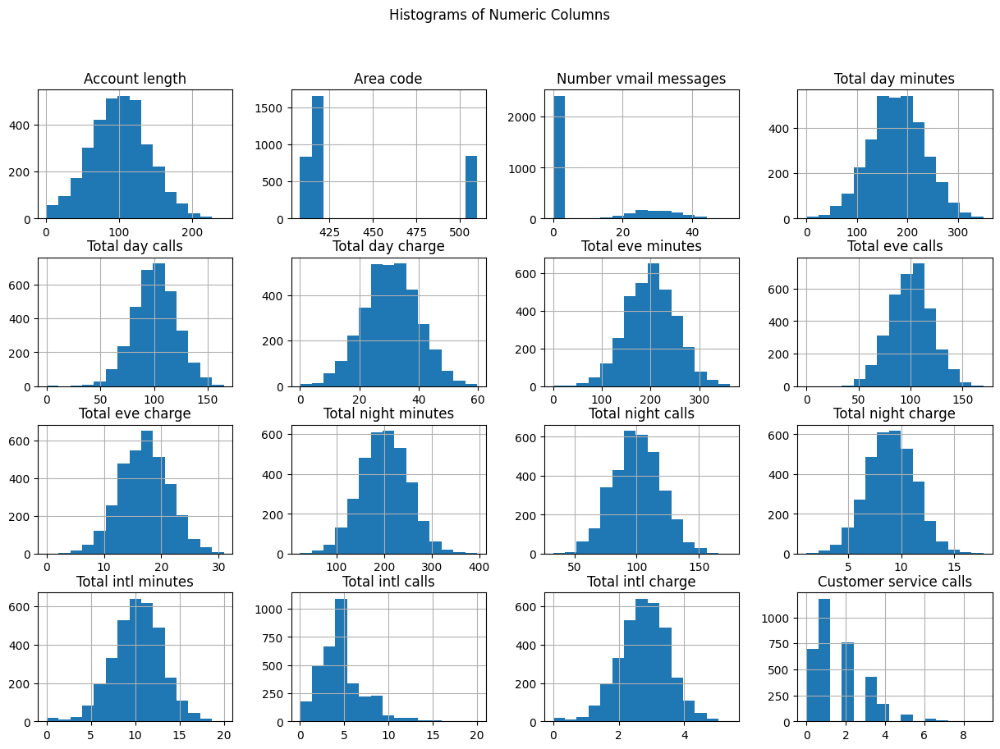

In [16]:
# Histogram for each numeric column

df[numeric_columns].hist(bins=15, figsize=(15, 10))
plt.suptitle('Histograms of Numeric Columns')
plt.show()

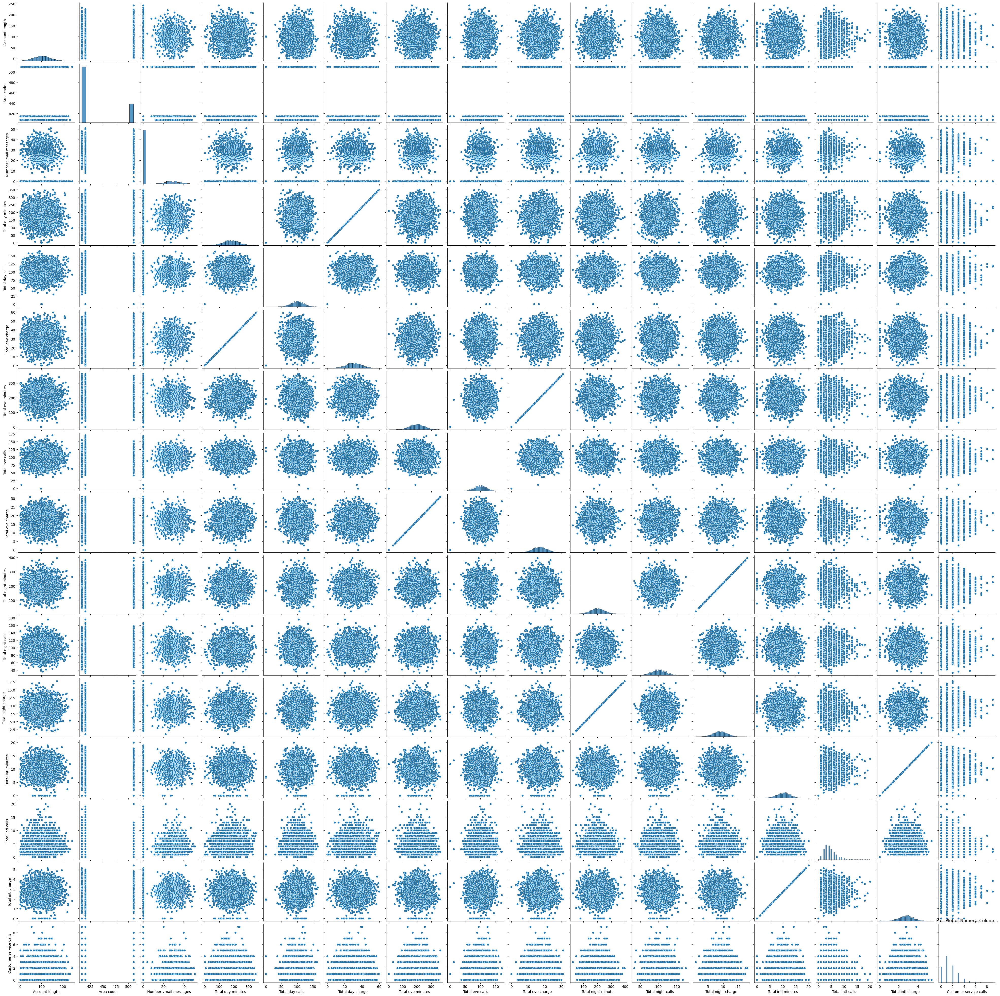

In [17]:
# Pair plot to explore relationships between variables
sns.pairplot(df[numeric_columns])
plt.title('Pair Plot of Numeric Columns')
plt.show()

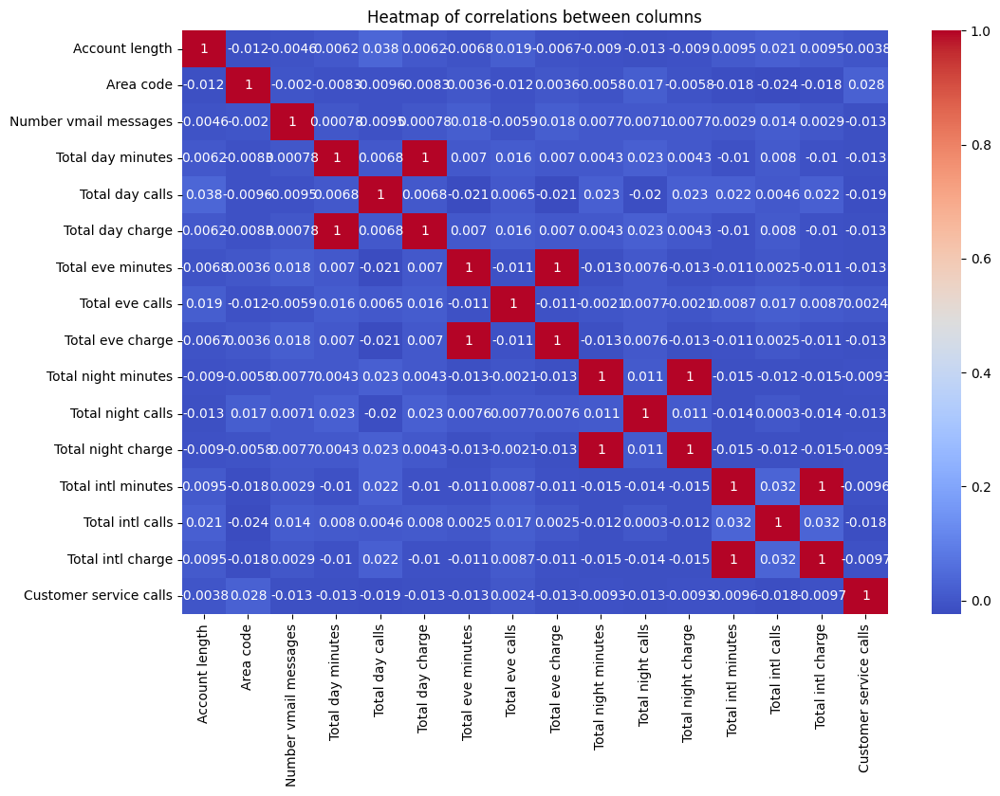

In [18]:
# Heatmap of correlations between columns
plt.figure(figsize=(12, 8))
sns.heatmap(df[numeric_columns].corr(), annot=True, cmap='coolwarm')
plt.title('Heatmap of correlations between columns')
plt.show()

<h2 style="color:green">3.Identify patterns and potential anomalies. </h2>

In [19]:
# Show missing values
missing_value=df.isnull().sum()
print(missing_value)

Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64


In [20]:
# View duplicate values
duplicated_columns=df.duplicated(subset=None,keep='first')
print(duplicated_columns)

0       False
1       False
2       False
3       False
4       False
        ...  
3328    False
3329    False
3330    False
3331    False
3332    False
Length: 3333, dtype: bool


In [21]:
# Outliers Detection
#method IQR(inter quantile Range)
Q1=df[numeric_columns].quantile(0.25)
Q3=df[numeric_columns].quantile(0.75)
IQR=Q3 - Q1
outliers=((df[numeric_columns]<Q1 -1.5*IQR)| (df[numeric_columns]>Q3+1.5*IQR)).sum()
print(outliers)

Account length             18
Area code                   0
Number vmail messages       1
Total day minutes          25
Total day calls            23
Total day charge           25
Total eve minutes          24
Total eve calls            20
Total eve charge           24
Total night minutes        30
Total night calls          22
Total night charge         30
Total intl minutes         46
Total intl calls           78
Total intl charge          49
Customer service calls    267
dtype: int64


In [22]:
print(f'number of outliers in the dataset : {outliers.sum()}')

number of outliers in the dataset : 682


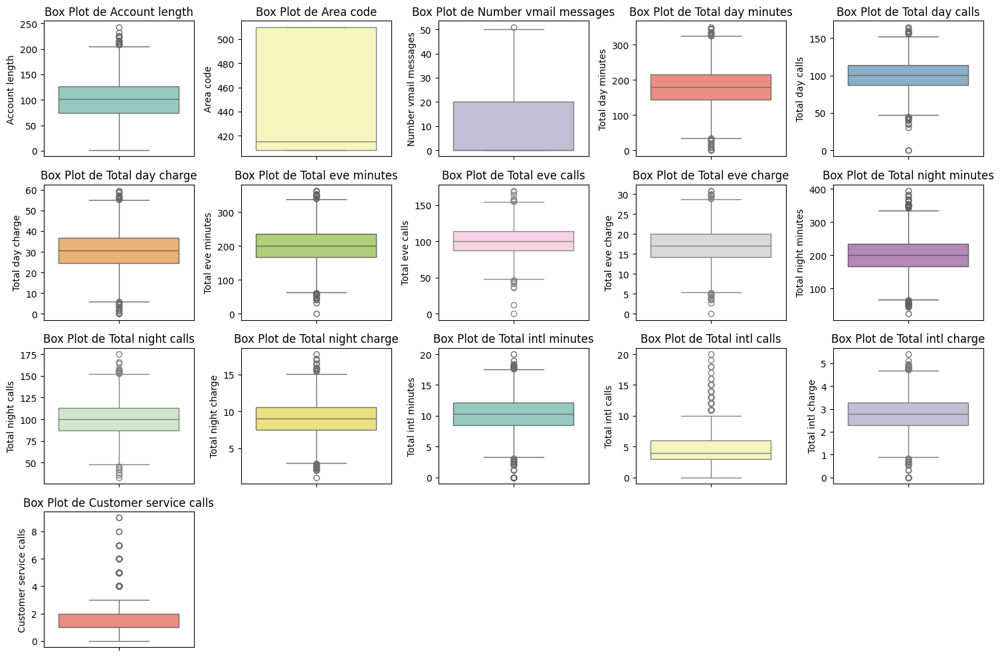

In [23]:
# Boxplot to view outliers

colors = sns.color_palette("Set3", n_colors=len(numeric_columns))
plt.figure(figsize=(15, 10))
for i, col in enumerate(numeric_columns, 1):
    plt.subplot(4, 5, i)
    sns.boxplot(y=df[col], color=colors[i-1])
    plt.title(f'Box Plot de {col}')
plt.tight_layout()
plt.show()

<h1 style="color:red">II.Feature Engineering</h1>

<h1 style="color:green" >1.Treat Outliers</h1>

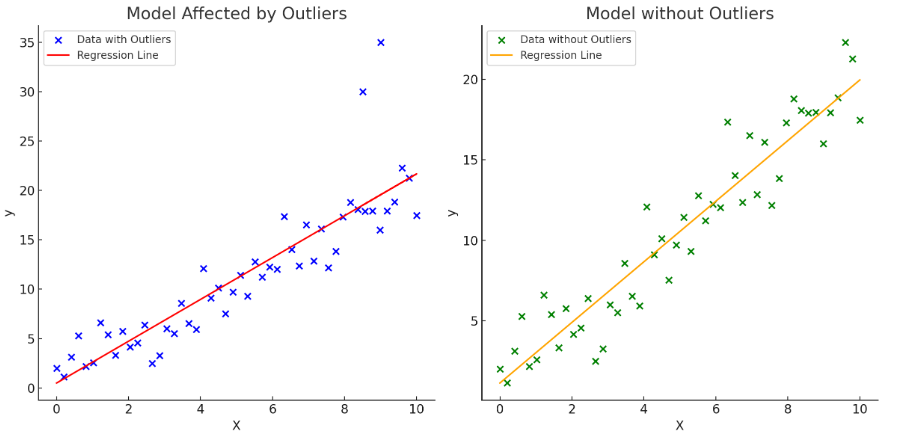

In [24]:
# # Define a function to manage outliers with IQR verification
def handle_outliers(data, column):
    if data[column].isnull().all():
        print(f"column {column} contains only NaN. Ignorée.")
        return  # Ignore empty columns
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    if IQR == 0:
        print(f"IQR for {column} is 0. Ignorée.")
        return  # Ignore if no variation
    min_value = Q1 - 1.5 * IQR
    max_value = Q3 + 1.5 * IQR
    # Clip the values to the calculated range
    data[column] = data[column].clip(lower=min_value, upper=max_value)

# Apply Outlier Processing
for column in numeric_columns:
    handle_outliers(df, column)


<h2 style="color:green">2.Create new Feature</h2>


<div style="display: flex; justify-content: space-around; align-items: center;">
  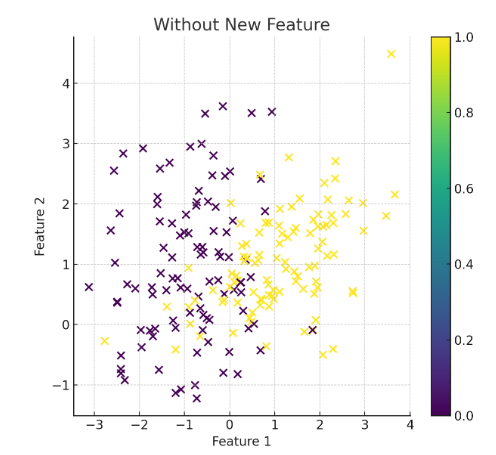
  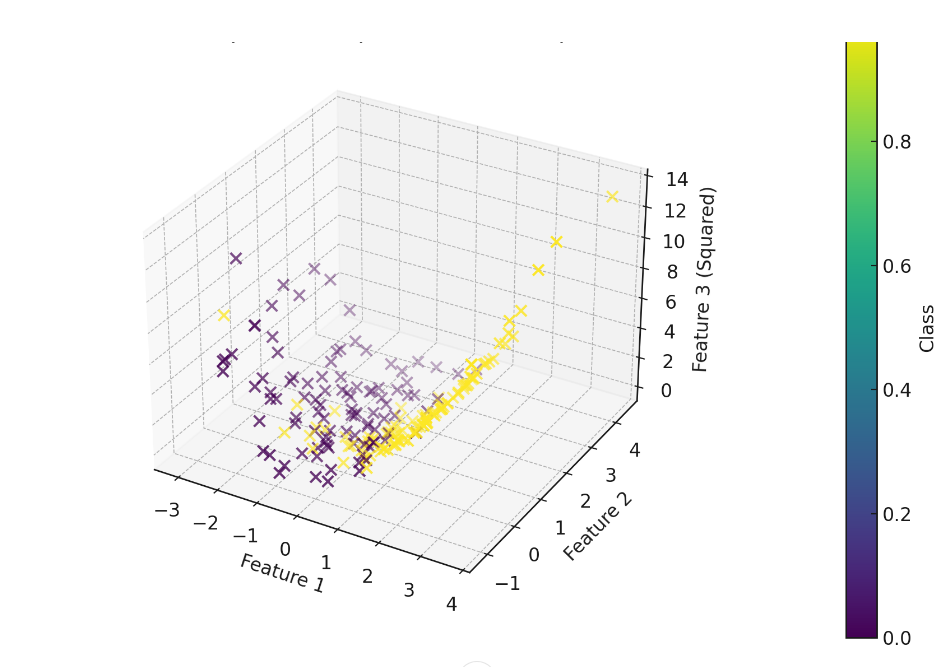
</div>


In [25]:
df['Intl Call per Minute'] = df['Total intl calls'] / df['Total intl minutes'] + 1
df['Total Cost'] = df['Total intl charge'] + df['Total day charge'] + df['Total eve charge']
df['Customer Service Call Ratio'] = df['Customer service calls'] / (df['Total day minutes'] + df['Total eve minutes'] + df['Total intl minutes'] + 1)

df['Avg Cost per Minute'] = df['Total Cost'] / (df['Total day minutes'] + df['Total eve minutes'] + df['Total intl minutes'] + 1)
df['Intl Call Ratio'] = df['Total intl calls'] / (df['Total day calls'] + df['Total eve calls'] + df['Total intl calls'] + 1)
df['Intl Minutes Ratio'] = df['Total intl minutes'] / (df['Total day minutes'] + df['Total eve minutes'] + df['Total intl minutes'] + 1)
df['Normalized Customer Service Calls'] = df['Customer service calls'] / (df['Total day calls'] + df['Total eve calls'] + df['Total intl calls'] + 1)
df['Customer Service Issue Index'] = (df['Customer service calls'] * df['Total Cost']) / (df['Total day minutes'] + df['Total eve minutes'] + df['Total intl minutes'] + 1)
df['Service Call to Total Call Ratio'] = df['Customer service calls'] / (df['Total day calls'] + df['Total eve calls'] + df['Total intl calls'] + 1)


In [26]:

print(df.isnull().sum())


Account length                       0
Area code                            0
International plan                   0
Voice mail plan                      0
Number vmail messages                0
Total day minutes                    0
Total day calls                      0
Total day charge                     0
Total eve minutes                    0
Total eve calls                      0
Total eve charge                     0
Total night minutes                  0
Total night calls                    0
Total night charge                   0
Total intl minutes                   0
Total intl calls                     0
Total intl charge                    0
Customer service calls               0
Churn                                0
Intl Call per Minute                 0
Total Cost                           0
Customer Service Call Ratio          0
Avg Cost per Minute                  0
Intl Call Ratio                      0
Intl Minutes Ratio                   0
Normalized Customer Servi

In [27]:

df=df.dropna()
print(df.isna().sum())

Account length                       0
Area code                            0
International plan                   0
Voice mail plan                      0
Number vmail messages                0
Total day minutes                    0
Total day calls                      0
Total day charge                     0
Total eve minutes                    0
Total eve calls                      0
Total eve charge                     0
Total night minutes                  0
Total night calls                    0
Total night charge                   0
Total intl minutes                   0
Total intl calls                     0
Total intl charge                    0
Customer service calls               0
Churn                                0
Intl Call per Minute                 0
Total Cost                           0
Customer Service Call Ratio          0
Avg Cost per Minute                  0
Intl Call Ratio                      0
Intl Minutes Ratio                   0
Normalized Customer Servi

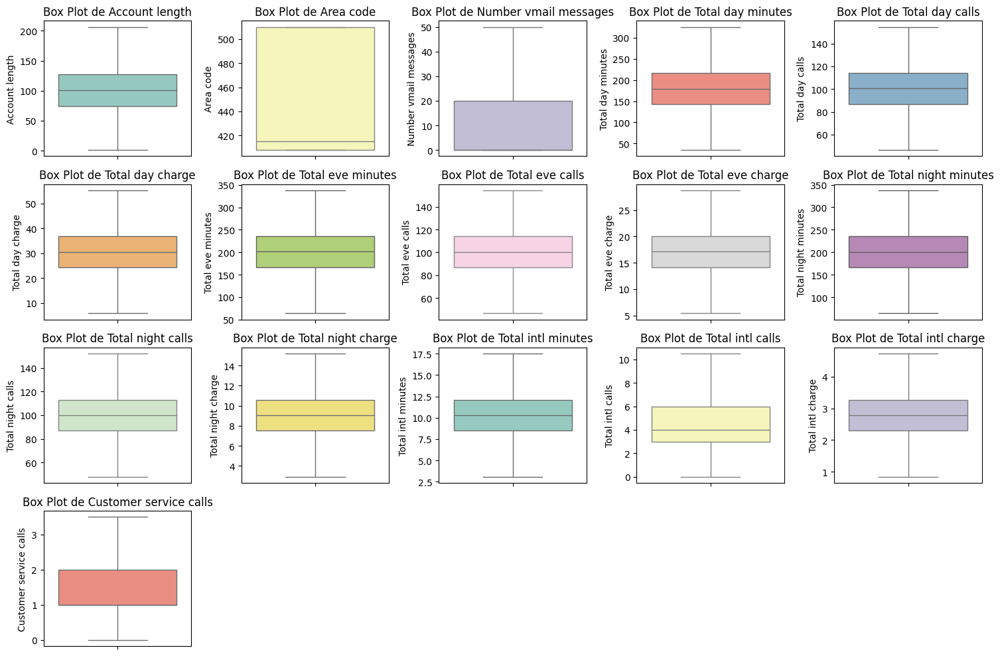

In [28]:
# Boxplot to view outliers after treat outliers
colors = sns.color_palette("Set3", n_colors=len(numeric_columns))
plt.figure(figsize=(15, 10))
for i, col in enumerate(numeric_columns, 1):
    plt.subplot(4, 5, i)
    sns.boxplot(y=df[col],color=colors[i-1])
    plt.title(f'Box Plot de {col}')
plt.tight_layout()
plt.show()

<h2 style="color:green"> 2.Data Transformation</h2>

<div style="background-color: #f9f9f9; border: 1px solid #ddd; border-radius: 8px; padding: 15px; margin: 10px 0; font-family: Arial, sans-serif; line-height: 1.6;">



Transforming categorical columns into numerical values is **essential** for machine learning models, as they require numerical data for calculations.  
Methods like **one-hot encoding** or **label encoding** convert categories into numbers, allowing the model to learn and make predictions effectively.  

We choose **OneHotEncoder** since these values are **categorical types nominal**, not ordinal (because there is no indication that these variables are ordered).
</div>


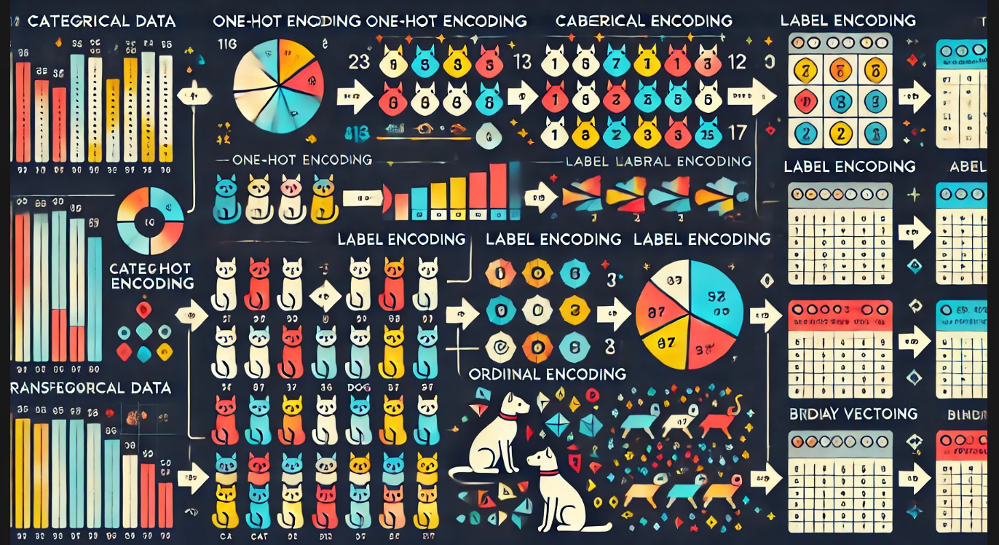

In [29]:
#  transformation of values from categorical to Numerique
categorical_columns
df_encoder=pd.get_dummies(df,columns=['International plan','Voice mail plan'])
df=df_encoder
df


,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,...,Avg Cost per Minute,Intl Call Ratio,Intl Minutes Ratio,Normalized Customer Service Calls,Customer Service Issue Index,Service Call to Total Call Ratio,International plan_No,International plan_Yes,Voice mail plan_No,Voice mail plan_Yes
0,128.0,415,25,265.1,110.0,45.07,197.40,99.0,16.78,244.7,...,0.136325,0.014085,0.021119,0.004695,0.136325,0.004695,True,False,False,True
1,107.0,415,26,161.6,123.0,27.47,195.50,103.0,16.62,254.4,...,0.128537,0.013043,0.036848,0.004348,0.128537,0.004348,True,False,False,True
2,137.0,415,0,243.4,114.0,41.38,121.20,110.0,10.30,162.6,...,0.145500,0.021739,0.032292,0.000000,0.000000,0.000000,True,False,True,False
3,84.0,408,0,299.4,71.0,50.90,63.55,88.0,5.40,196.9,...,0.156740,0.041916,0.017811,0.011976,0.313480,0.011976,False,True,True,False
4,75.0,415,0,166.7,113.0,28.34,148.30,122.0,12.61,186.9,...,0.133947,0.012552,0.030972,0.012552,0.401840,0.012552,False,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,114.0,415,26,137.1,88.0,23.31,155.70,125.0,13.23,247.6,...,0.129872,0.031674,0.037668,0.009050,0.259745,0.009050,True,False,False,True
3329,106.0,408,29,83.6,131.0,14.21,203.90,131.0,17.33,229.5,...,0.113722,0.011278,0.027310,0.003759,0.113722,0.003759,True,False,False,True
3330,60.0,415,0,193.9,118.0,32.96,85.00,110.0,7.23,210.1,...,0.149266,0.033755,0.045036,0.012658,0.447799,0.012658,True,False,True,False
3331,159.0,415,0,169.8,114.0,28.87,197.70,105.0,16.80,193.7,...,0.128387,0.017857,0.030518,0.004464,0.128387,0.004464,True,False,True,False


In [30]:
# Transform Boolean variables to int
bool_columns=df.select_dtypes(include=['bool']).columns
df[bool_columns] = df[bool_columns].astype(int)
df

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,...,Avg Cost per Minute,Intl Call Ratio,Intl Minutes Ratio,Normalized Customer Service Calls,Customer Service Issue Index,Service Call to Total Call Ratio,International plan_No,International plan_Yes,Voice mail plan_No,Voice mail plan_Yes
0,128.0,415,25,265.1,110.0,45.07,197.40,99.0,16.78,244.7,...,0.136325,0.014085,0.021119,0.004695,0.136325,0.004695,1,0,0,1
1,107.0,415,26,161.6,123.0,27.47,195.50,103.0,16.62,254.4,...,0.128537,0.013043,0.036848,0.004348,0.128537,0.004348,1,0,0,1
2,137.0,415,0,243.4,114.0,41.38,121.20,110.0,10.30,162.6,...,0.145500,0.021739,0.032292,0.000000,0.000000,0.000000,1,0,1,0
3,84.0,408,0,299.4,71.0,50.90,63.55,88.0,5.40,196.9,...,0.156740,0.041916,0.017811,0.011976,0.313480,0.011976,0,1,1,0
4,75.0,415,0,166.7,113.0,28.34,148.30,122.0,12.61,186.9,...,0.133947,0.012552,0.030972,0.012552,0.401840,0.012552,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,114.0,415,26,137.1,88.0,23.31,155.70,125.0,13.23,247.6,...,0.129872,0.031674,0.037668,0.009050,0.259745,0.009050,1,0,0,1
3329,106.0,408,29,83.6,131.0,14.21,203.90,131.0,17.33,229.5,...,0.113722,0.011278,0.027310,0.003759,0.113722,0.003759,1,0,0,1
3330,60.0,415,0,193.9,118.0,32.96,85.00,110.0,7.23,210.1,...,0.149266,0.033755,0.045036,0.012658,0.447799,0.012658,1,0,1,0
3331,159.0,415,0,169.8,114.0,28.87,197.70,105.0,16.80,193.7,...,0.128387,0.017857,0.030518,0.004464,0.128387,0.004464,1,0,1,0


In [31]:

df


,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,...,Avg Cost per Minute,Intl Call Ratio,Intl Minutes Ratio,Normalized Customer Service Calls,Customer Service Issue Index,Service Call to Total Call Ratio,International plan_No,International plan_Yes,Voice mail plan_No,Voice mail plan_Yes
0,128.0,415,25,265.1,110.0,45.07,197.40,99.0,16.78,244.7,...,0.136325,0.014085,0.021119,0.004695,0.136325,0.004695,1,0,0,1
1,107.0,415,26,161.6,123.0,27.47,195.50,103.0,16.62,254.4,...,0.128537,0.013043,0.036848,0.004348,0.128537,0.004348,1,0,0,1
2,137.0,415,0,243.4,114.0,41.38,121.20,110.0,10.30,162.6,...,0.145500,0.021739,0.032292,0.000000,0.000000,0.000000,1,0,1,0
3,84.0,408,0,299.4,71.0,50.90,63.55,88.0,5.40,196.9,...,0.156740,0.041916,0.017811,0.011976,0.313480,0.011976,0,1,1,0
4,75.0,415,0,166.7,113.0,28.34,148.30,122.0,12.61,186.9,...,0.133947,0.012552,0.030972,0.012552,0.401840,0.012552,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,114.0,415,26,137.1,88.0,23.31,155.70,125.0,13.23,247.6,...,0.129872,0.031674,0.037668,0.009050,0.259745,0.009050,1,0,0,1
3329,106.0,408,29,83.6,131.0,14.21,203.90,131.0,17.33,229.5,...,0.113722,0.011278,0.027310,0.003759,0.113722,0.003759,1,0,0,1
3330,60.0,415,0,193.9,118.0,32.96,85.00,110.0,7.23,210.1,...,0.149266,0.033755,0.045036,0.012658,0.447799,0.012658,1,0,1,0
3331,159.0,415,0,169.8,114.0,28.87,197.70,105.0,16.80,193.7,...,0.128387,0.017857,0.030518,0.004464,0.128387,0.004464,1,0,1,0



<h2 style="color:green">Normalization</h2>


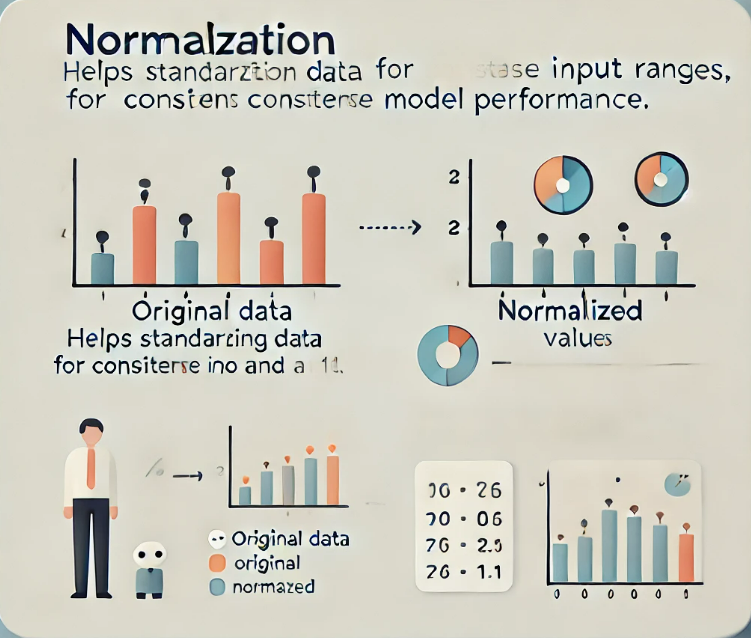

In [32]:
#Normalization of the dataset
scaler=MinMaxScaler()
df_normalisés=pd.DataFrame(scaler.fit_transform(df),columns=df.columns)
df=df_normalisés
df

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,...,Avg Cost per Minute,Intl Call Ratio,Intl Minutes Ratio,Normalized Customer Service Calls,Customer Service Issue Index,Service Call to Total Call Ratio,International plan_No,International plan_Yes,Voice mail plan_No,Voice mail plan_Yes
0,0.618005,0.068627,0.50,0.792469,0.587963,0.792476,0.487082,0.486111,0.487158,0.659407,...,0.638210,0.184440,0.196904,0.177062,0.247579,0.177062,1.0,0.0,0.0,1.0
1,0.515815,0.068627,0.52,0.436554,0.708333,0.436489,0.480167,0.523148,0.480308,0.694912,...,0.504021,0.170807,0.399936,0.163975,0.233435,0.163975,1.0,0.0,0.0,1.0
2,0.661800,0.068627,0.00,0.717847,0.625000,0.717840,0.209789,0.587963,0.209760,0.358895,...,0.796290,0.284679,0.341130,0.000000,0.000000,0.000000,1.0,0.0,1.0,0.0
3,0.403893,0.000000,0.00,0.910420,0.226852,0.910396,0.000000,0.384259,0.000000,0.484444,...,0.989943,0.548902,0.154202,0.451668,0.569308,0.451668,0.0,1.0,1.0,0.0
4,0.360097,0.068627,0.00,0.454092,0.615741,0.454086,0.308406,0.699074,0.308647,0.447840,...,0.597229,0.164375,0.324089,0.473401,0.729778,0.473401,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,0.549878,0.068627,0.52,0.352304,0.384259,0.352346,0.335335,0.726852,0.335188,0.670022,...,0.527030,0.414781,0.410522,0.341306,0.471720,0.341306,1.0,0.0,0.0,1.0
3329,0.510949,0.000000,0.58,0.168329,0.782407,0.168285,0.510735,0.782407,0.510702,0.603770,...,0.248774,0.147691,0.276810,0.141783,0.206530,0.141783,1.0,0.0,0.0,1.0
3330,0.287105,0.068627,0.00,0.547627,0.662037,0.547532,0.078057,0.587963,0.078339,0.532760,...,0.861179,0.442033,0.505632,0.477396,0.813245,0.477396,1.0,0.0,1.0,0.0
3331,0.768856,0.068627,0.00,0.464752,0.625000,0.464806,0.488173,0.541667,0.488014,0.472731,...,0.501444,0.233844,0.318231,0.168367,0.233163,0.168367,1.0,0.0,1.0,0.0


In [33]:
target_columns=df['Churn']

filtred_target_column_0=target_columns[target_columns==0.0]
filtred_target_column_1=target_columns[target_columns==1.0]
print(len(filtred_target_column_0))
print(len(filtred_target_column_1))

2850
483


In [34]:
target_column='Churn'
X_train=df.drop(columns=[target_column])
y=df['Churn']


<h2 style="color:green">3.Feature Sélection</h2> 

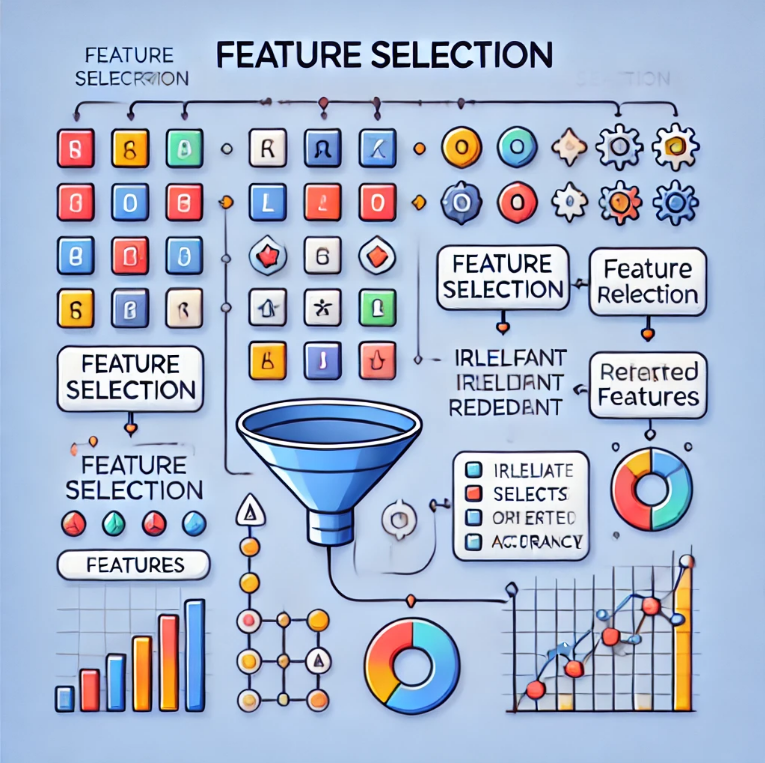

* **SelectKBest:** Selects the top 'k' features based on a chosen statistical test.
  * **chi2:**: Assesses the relationship between categorical features and the target variable

  
* **k=24:** Specifies that 17 features with the highest chi-squared scores should be selected.ng.

In [35]:
# Initialize the SelectKBest feature selection method
# chi2: Statistical test to assess the dependence between categorical target and features
# k=24: Select the top 24 features based on the chi-squared scores
selector = SelectKBest(chi2, k=24)

# Apply the feature selection to the training data
# X_train: Features in the training set
# y: Target variable
X_new_train = selector.fit_transform(X_train, y)

# Get the indices of the selected features
selected_indices = selector.get_support(indices=True)

# Retrieve the column names corresponding to the selected features
selected_columns = X_train.columns[selected_indices]

# Print the list of selected feature names
print("Selected Features:", selected_columns.tolist())


Selected Features: ['Number vmail messages', 'Total day minutes', 'Total day charge', 'Total eve minutes', 'Total eve charge', 'Total night minutes', 'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls', 'Intl Call per Minute', 'Total Cost', 'Customer Service Call Ratio', 'Avg Cost per Minute', 'Intl Call Ratio', 'Intl Minutes Ratio', 'Normalized Customer Service Calls', 'Customer Service Issue Index', 'Service Call to Total Call Ratio', 'International plan_No', 'International plan_Yes', 'Voice mail plan_No', 'Voice mail plan_Yes']


<h1 style="color:red"> III.Model training and evaluation</h1>

<h3 style="color:blue"> test metrics,Common point in algorithms</h3>

<div style="font-family: Arial, sans-serif; display: flex; flex-direction: column; padding: 20px;">
  <!-- Accuracy Section -->
  <div style="display: flex; align-items: center; margin-bottom: 20px; color: #4CAF50;">
    <i class="fas fa-check-circle" style="font-size: 24px; color: #4CAF50; margin-right: 10px;"></i>
    <h2 style="margin: 0;">Accuracy</h2>
  </div>
   <span style="font-weight: bold;">TP + TN</span> / <span style="font-weight: bold;">(TP + TN + FP + FN)</span>
  

  <!-- Precision Section -->
  <div style="display: flex; align-items: center; margin-bottom: 20px; color: #2196F3;">
    <i class="fas fa-balance-scale" style="font-size: 24px; color: #2196F3; margin-right: 10px;"></i>
    <h2 style="margin: 0;">2. Précision</h2>
  </div>
   <span style="font-weight: bold;">TP</span> / <span style="font-weight: bold;">(TP + FP)</span>


  <!-- Recall Section -->
  <div style="display: flex; align-items: center; margin-bottom: 20px; color: #FF9800;">
    <i class="fas fa-search" style="font-size: 24px; color: #FF9800; margin-right: 10px;"></i>
    <h2 style="margin: 0;">Rappel</h2>
  </div>
   <span style="font-weight: bold;">TP</span> / <span style="font-weight: bold;">(TP + FN)</span>


  <!-- F1-Score Section -->
  <div style="display: flex; align-items: center; margin-bottom: 20px; color: #9C27B0;">
    <i class="fas fa-medal" style="font-size: 24px; color: #9C27B0; margin-right: 10px;"></i>
    <h2 style="margin: 0;"> F1-Score</h2>
  </div>
   <span style="font-weight: bold;">2 × (Précision × Recall)</span> / <span style="font-weight: bold;">(Précision + Recall)</span>

</div>


<h2 style="color:green">1.Logistic Regression
 </h2>

<div style="font-family: 'Segoe UI', Tahoma, sans-serif; line-height: 1.8; color: #2c3e50; padding: 30px; border: 1px solid #e0e0e0; border-radius: 12px; background-color: #f9f9f9; max-width: 1050px; margin: 20px auto; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">

  <h2 style="text-align: center; color: #2980b9; margin-bottom: 20px;">📊 Logistic Regression</h2>

  <h3 style="color: #16a085; margin-bottom: 15px;">🔍 Key Concepts</h3>

  <div style="margin-bottom: 20px;">
    <strong style="color: #2980b9;">✨ Sigmoid Function:</strong>  
    <span>Transforms linear predictions into probabilities between 0 and 1. It is defined as: </span>
    <div style="background-color: #f0f8ff; padding: 10px; margin-top: 10px; border-radius: 8px; font-family: monospace;">
      <em>σ(z) = 1 / (1 + e<sup>-z</sup>)</em>
    </div>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #2980b9;">✨ Regularization:</strong>  
    <span>Prevents overfitting by adding a penalty to large coefficients.</span>
    <ul style="margin-top: 10px; padding-left: 20px;">
      <li><strong>L1:</strong> Lasso regularization, encourages sparse solutions (some coefficients become zero).</li>
      <li><strong>L2:</strong> Ridge regularization, shrinks coefficients but does not force them to zero.</li>
    </ul>
  </div>

  <h3 style="color: #16a085; margin-bottom: 15px;">⚙️ Important Hyperparameters</h3>
  
  <div style="margin-bottom: 20px;">
    <ul style="margin-top: 10px; padding-left: 20px;">
      <li><strong>C:</strong> Regularization strength (smaller values increase regularization).</li>
      <li><strong>Solver:</strong> Optimization algorithms (e.g., <code>'liblinear'</code>, <code>'saga'</code>) to minimize the loss function.</li>
      <li><strong>Max_iter:</strong> Maximum number of iterations to achieve convergence.</li>
    </ul>
  </div>

</div>


C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


Accuracy: 0.82
Roc AUC Score: 0.84
ROC AUC SCORE TRAIN 0.8785408063355377
Classification Report(Test):
              precision    recall  f1-score   support

         0.0       0.96      0.83      0.89       574
         1.0       0.42      0.76      0.54        93

    accuracy                           0.82       667
   macro avg       0.69      0.80      0.72       667
weighted avg       0.88      0.82      0.84       667

Classification Report (Train):
              precision    recall  f1-score   support

         0.0       0.82      0.81      0.81      2276
         1.0       0.81      0.83      0.82      2276

    accuracy                           0.82      4552
   macro avg       0.82      0.82      0.82      4552
weighted avg       0.82      0.82      0.82      4552



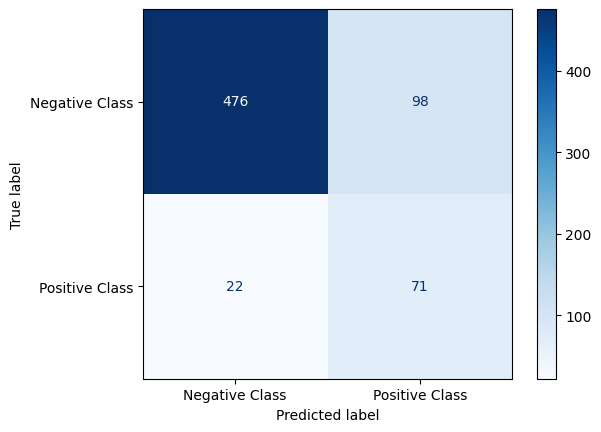

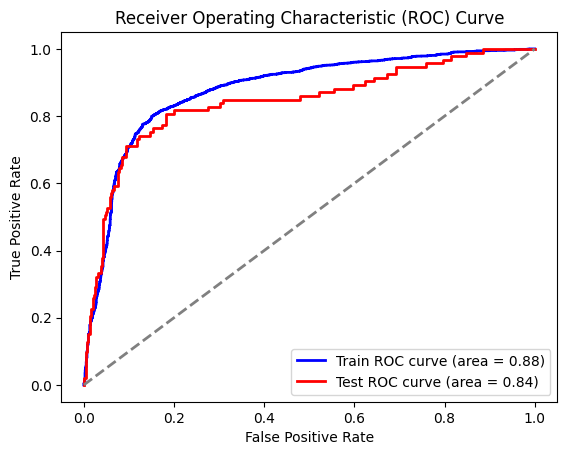

In [36]:
# Split the data into training and test sets
# X_train_rl and y_train_rl are used to train the model
# X_test_rl and y_test_rl are used to test and evaluate the model
X_train_rl, X_test_rl, y_train_rl, y_test_rl = train_test_split(X_new_train, y, test_size=0.2, random_state=42)

# Handle class imbalance using SMOTETomek
# Applies SMOTE oversampling to increase minority class samples and
# removes Tomek Links to clean overlapping samples
smote_tomek = SMOTE(random_state=42)
X_train_resample_rl, y_train_resample_rl = smote_tomek.fit_resample(X_train_rl, y_train_rl)

# Define the hyperparameter grid to test
# Parameters for optimizing the logistic regression model with GridSearchCV
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  # Regularization strength (inverse of regularization)
    'solver': ['liblinear', 'saga'],  # Optimization algorithms to test
    'penalty': ['l1', 'l2'],  # Regularization types to control model complexity
    'max_iter': [100, 200, 300]  # Maximum number of iterations for convergence
}

# Initialize the logistic regression model with specific parameters
logreg_model = LogisticRegression(random_state=42, max_iter=200, C=185, penalty='l2',class_weight='balanced',solver='liblinear')

# Train the logistic regression model on the resampled data
logreg_model.fit(X_train_resample_rl, y_train_resample_rl)
# Make predictions on the test set
y_pred_rl = logreg_model.predict(X_test_rl)  # Class predictions
y_pred_prob_rl = logreg_model.predict_proba(X_test_rl)[:, 1]  # Probabilities for the positive class
# Evaluate the model
accuracy_rl = accuracy_score(y_test_rl, y_pred_rl)  # Compute model accuracy
conf_matrix_rl = confusion_matrix(y_test_rl, y_pred_rl)  # Generate the confusion matrix
roc_auc_rl = roc_auc_score(y_test_rl, y_pred_prob_rl)  # Calculate the ROC-AUC score
y_train_predict_proba_rl = logreg_model.predict_proba(X_train_resample_rl)[:, 1]
roc_auc_score_train_rl = roc_auc_score(y_train_resample_rl, y_train_predict_proba_rl)
y_train_predict_rl = logreg_model.predict(X_train_resample_rl)
classification_report_train_rl = classification_report(y_train_resample_rl, y_train_predict_rl)

# ROC curve for training data
fpr_train_rl, tpr_train_rl, _ = roc_curve(y_train_resample_rl, y_train_predict_proba_rl)
roc_auc_train_rl = auc(fpr_train_rl, tpr_train_rl)

# ROC curve for test data
fpr_test_rl, tpr_test_rl, _ = roc_curve(y_test_rl, y_pred_prob_rl)
roc_auc_test_rl = auc(fpr_test_rl, tpr_test_rl)



class_report_rl = classification_report(y_test_rl, y_pred_rl)  # Detailed classification report
# Display the results
print(f"Accuracy: {accuracy_rl:.2f}")  # Print accuracy with two decimal places
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_rl, display_labels=["Negative Class", "Positive Class"])
disp.plot(cmap="Blues")  # Display the confusion matrix as a plot with a blue colormap
print(f"Roc AUC Score: {roc_auc_rl:.2f}")  # Print the ROC-AUC score with two decimal places
print("ROC AUC SCORE TRAIN", roc_auc_score_train_rl)
print("Classification Report(Test):")  # Print the classification report
print(class_report_rl)
print("Classification Report (Train):")
print(classification_report_train_rl)

# Plot ROC curve
plt.figure()
plt.plot(fpr_train_rl, tpr_train_rl, color='blue', lw=2, label=f'Train ROC curve (area = {roc_auc_train_rl:.2f})')
plt.plot(fpr_test_rl, tpr_test_rl, color='red', lw=2, label=f'Test ROC curve (area = {roc_auc_test_rl:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()




<h2 style="color:green">2.Decision Tree</h2>

<div style="font-family: 'Segoe UI', Tahoma, sans-serif; line-height: 1.8; color: #2c3e50; padding: 30px; border: 1px solid #e0e0e0; border-radius: 12px; background-color: #fafafa; max-width: 1050px; margin: 20px auto; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">

  <h2 style="text-align: center; color: #16a085; margin-bottom: 20px;">🌳 Decision Tree Overview</h2>

  <div style="margin-bottom: 20px;">
    <strong style="color: #1abc9c;">🌱 Tree Structure:</strong>
    <p>The decision tree splits data into branches based on features at each node.</p>
    <ul style="margin-top: 10px; padding-left: 20px;">
      <li><strong>Nodes:</strong> Represent decisions based on specific features.</li>
      <li><strong>Branches:</strong> Represent the possible outcomes of those decisions.</li>
    </ul>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #1abc9c;">⚖️ Splitting Criteria:</strong>
    <ul style="margin-top: 10px; padding-left: 20px;">
      <li><strong>Entropy:</strong> Measures the impurity or disorder in a dataset. The algorithm aims to minimize entropy, creating more homogeneous subsets (pure nodes).</li>
      <li><strong>Gini Index:</strong> An alternative impurity measure, often used as a substitute for entropy.</li>
    </ul>
  </div>

  <h3 style="color: #e67e22; margin-bottom: 15px;">⚙️ Hyperparameters</h3>

  <div style="margin-bottom: 20px;">
    <strong style="color: #e67e22;">🔑 max_depth:</strong>  
    <span>The maximum depth of the tree (i.e., the longest path from the root to a leaf). Limiting depth helps prevent overfitting.</span>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #e67e22;">🔑 min_samples_split:</strong>  
    <span>The minimum number of samples required to split an internal node. Controls the tree’s growth.</span>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #e67e22;">🔑 min_samples_leaf:</strong>  
    <span>The minimum number of samples needed in a leaf node. Helps avoid overly specific rules.</span>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #e67e22;">🔑 max_leaf_nodes:</strong>  
    <span>Limits the maximum number of leaf nodes in the tree.</span>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #e67e22;">🔑 min_impurity_decrease:</strong>  
    <span>Defines the minimum decrease in impurity (e.g., Gini or entropy) required to make a split. Determines when to stop splitting.</span>
  </div>

  <h3 style="color: #f39c12; margin-bottom: 15px;">🔧 Advanced Techniques</h3>

  <div style="margin-bottom: 20px;">
    <strong style="color: #f39c12;">🔄 SMOTE:</strong>  
    <span>Balances class distribution by generating synthetic examples for the minority class.</span>
  </div>

  <div>
    <strong style="color: #f39c12;">🔍 Grid Search:</strong>  
    <span>Finds the optimal combination of hyperparameters by testing various values and evaluating performance using cross-validation.</span>
  </div>

</div>


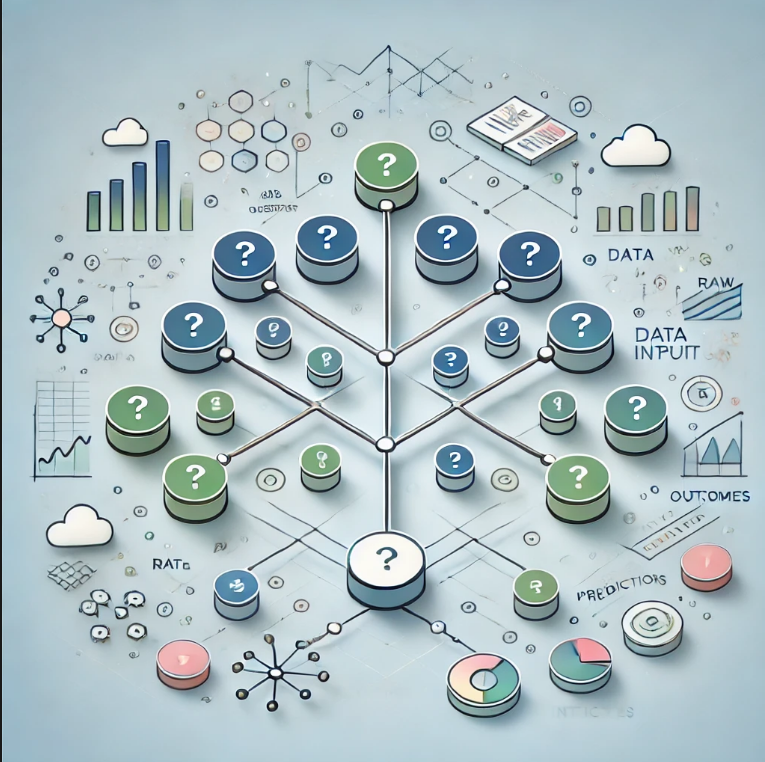

C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


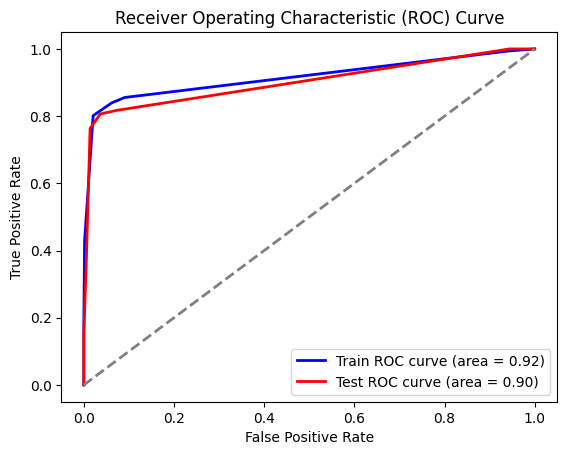

Accuracy: 0.9550
Confusion Matrix:
Classification Report:
ROC AUC SCORE TRAIN 0.9153998821661657
ROC AUC Score: 0.900884193173729
class Report(Test)
              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97       574
         1.0       0.90      0.76      0.83        93

    accuracy                           0.96       667
   macro avg       0.93      0.87      0.90       667
weighted avg       0.95      0.96      0.95       667

Classification Report (Train):
              precision    recall  f1-score   support

         0.0       0.83      0.98      0.90      2276
         1.0       0.97      0.80      0.88      2276

    accuracy                           0.89      4552
   macro avg       0.90      0.89      0.89      4552
weighted avg       0.90      0.89      0.89      4552



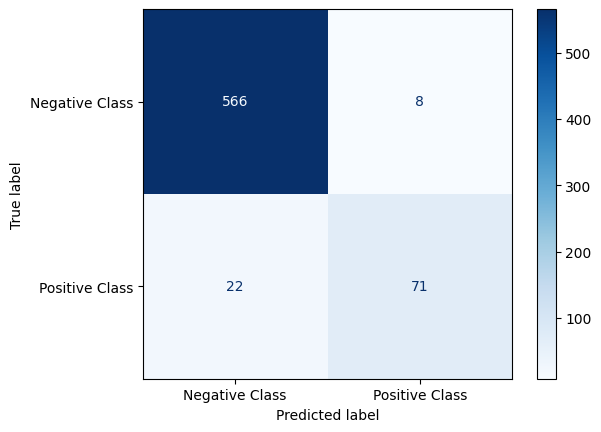

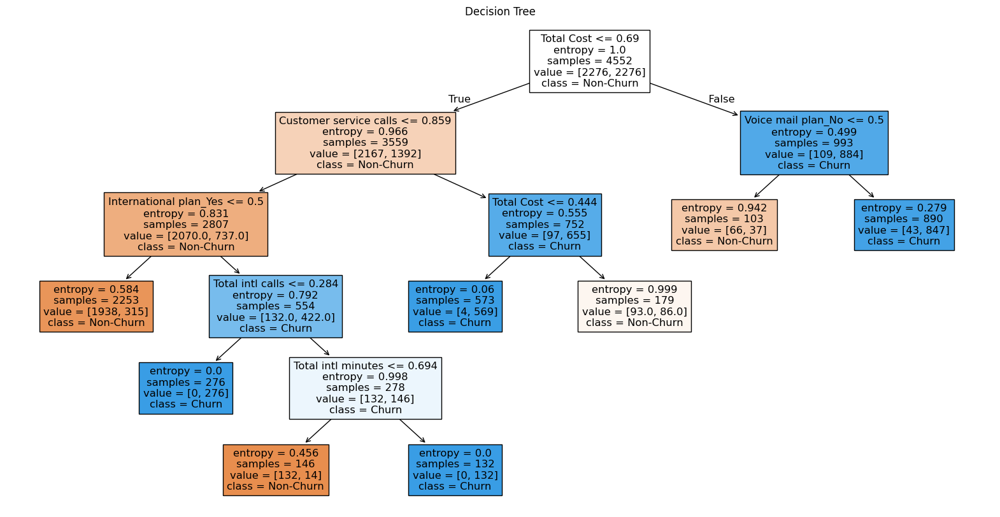

In [37]:
# Split the data into training and test sets
X_train_dt, X_test_dt, y_train_dt, y_test_dt = train_test_split(X_new_train, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the classes in the training set
smote_dt = SMOTE(random_state=42)
X_train_s, y_train_s = smote_dt.fit_resample(X_train_dt, y_train_dt)

# Initialize the decision tree classifier with default hyperparameters
model = DecisionTreeClassifier(
    random_state=42,  # Ensures reproducibility
    max_depth=5,  # Maximum depth of the tree
    min_samples_leaf=2,  # Minimum samples required at a leaf node
    min_samples_split=5,# Minimum samples required to split an internal node
    class_weight='balanced',
    min_impurity_decrease=0.02,  # Minimum impurity decrease required for a split
    max_leaf_nodes=50,  # Maximum number of leaf nodes
    criterion="entropy"  # Splitting criterion (entropy for information gain)
)

# Fit the model on the balanced training data
model.fit(X_train_s, y_train_s)

# Perform grid search to optimize hyperparameters
param_grid = {
    'max_depth': [3, 5, 7, 10],  # Test different maximum depths
    'min_samples_leaf': [1, 5, 10],  # Test different minimum leaf sizes
    'min_samples_split': [2, 5, 10, 20],  # Test different minimum splits
    'criterion': ['gini', 'entropy']  # Test different splitting criteria
}
grid_search = GridSearchCV(
    DecisionTreeClassifier(random_state=42),  # Decision tree as the base model
    param_grid,  # Parameter grid for tuning
    cv=5,  # 5-fold cross-validation
    scoring='accuracy'  # Evaluate based on accuracy
)
# grid_search.fit(X_train_s, y_train_s)

# # Display the best parameters from the grid search
# print("Best Parameters:", grid_search.best_params_)

# Predict outcomes on the test set
y_pred_dt = model.predict(X_test_dt)
# Classification report for training data
y_train_predict_dt = model.predict(X_train_s)
y_train_predict_proba_dt = model.predict_proba(X_train_s)[:, 1]
classification_report_train_dt = classification_report(y_train_s, y_train_predict_dt)
# ROC curve for training data
fpr_train_dt, tpr_train_dt, _ = roc_curve(y_train_s, y_train_predict_proba_dt)
roc_auc_train_dt = auc(fpr_train_dt, tpr_train_dt)

# ROC curve for test data
fpr_test_dt, tpr_test_dt, _ = roc_curve(y_test_dt,  model.predict_proba(X_test_dt)[:, 1])
roc_auc_test_dt = auc(fpr_test_dt, tpr_test_dt)

# Plot ROC curve
plt.figure()
plt.plot(fpr_train_dt, tpr_train_dt, color='blue', lw=2, label=f'Train ROC curve (area = {roc_auc_train_dt:.2f})')
plt.plot(fpr_test_dt, tpr_test_dt, color='red', lw=2, label=f'Test ROC curve (area = {roc_auc_test_dt:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Evaluate the model
accuracy = accuracy_score(y_test_dt, y_pred_dt)  # Calculate accuracy
print(f"Accuracy: {accuracy:.4f}")  # Print accuracy with four decimal places
print("Confusion Matrix:")

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test_dt, y_pred_dt), display_labels=["Negative Class", "Positive Class"])
disp.plot(cmap="Blues")  # Use a blue colormap for the confusion matrix plot
print("Classification Report:")
class_report_dt=classification_report(y_test_dt, y_pred_dt)  # Print detailed classification metrics

# Calculate the ROC AUC Score
roc_score_dt = roc_auc_score(y_test_dt, model.predict_proba(X_test_dt)[:, 1])  # Compute AUC-ROC score for the test set
roc_auc_score_train_dt = roc_auc_score(y_train_s, y_train_predict_proba_dt)
print("ROC AUC SCORE TRAIN", roc_auc_score_train_dt)


print("ROC AUC Score:", roc_score_dt)
print("class Report(Test)")
print(class_report_dt)
print("Classification Report (Train):")
print(classification_report_train_dt)

# Visualize the decision tree
plt.figure(figsize=(20, 10))  # Set the figure size
tree.plot_tree(
    model,
    feature_names=selected_columns,  # Use the selected features for visualization
    class_names=['Non-Churn', 'Churn'],  # Class labels for the tree
    filled=True  # Color the nodes based on class probabilities
)
plt.title("Decision Tree")  # Set the title of the plot
plt.show()  # Display the plot


<h2 style="color:green">3.KNN</h2>

<div style="font-family: 'Segoe UI', Tahoma, sans-serif; line-height: 1.8; color: #2c3e50; padding: 30px; border: 1px solid #eaeaea; border-radius: 12px; background-color: #fdfdfd; max-width: 1050px; margin: 20px auto; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);margin-left:10px;">

  <h2 style="text-align: center; color: #34495e; margin-bottom: 20px;">🔍 K-Nearest Neighbors (KNN) </h2>

  <div style="margin-bottom: 20px;">
    <strong style="color: #16a085;">📚 Lazy Learning:</strong>  
    <span>KNN is a non-parametric, lazy learning algorithm. It doesn't learn a model during training; instead, it stores the entire dataset and makes predictions during testing.</span>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #16a085;">🔢 K Parameter:</strong>  
    <span>The number of neighbors, <code>k</code>, determines how many of the nearest neighbors will be considered for making the prediction. A larger <code>k</code> makes the model more generalized, while a smaller <code>k</code> can lead to overfitting.</span>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #16a085;">📏 Distance Metric:</strong>  
    <span>KNN uses distance metrics like Euclidean (<code>p=2</code>) or Manhattan (<code>p=1</code>) distance to calculate how close other points are to the query point.</span>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #16a085;">⚖️ Weighted Voting:</strong>  
    <span>KNN can use uniform or distance-based weighting. In distance-based weighting, neighbors closer to the query point have more influence on the prediction.</span>
  </div>

  <div>
    <strong style="color: #16a085;">⚙️ SMOTETomek:</strong>  
    <span>Used to handle class imbalance by generating synthetic samples for the minority class and removing overlapping samples. This improves the model's ability to correctly predict the minority class.</span>
  </div>

</div>


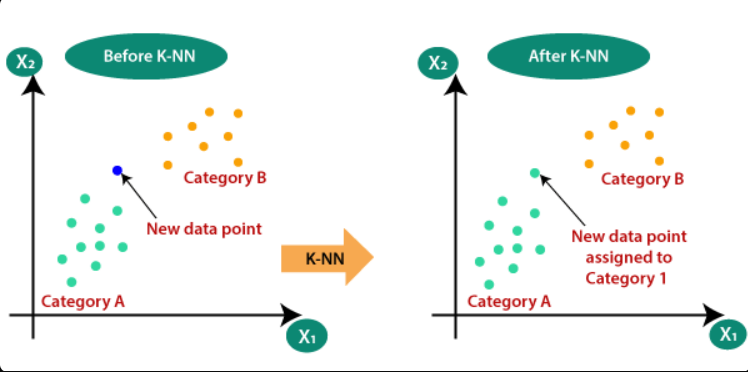

C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


ROC AUC SCORE TRAIN 0.9303494707515728
Accuracy: 0.83
ROC AUC: 0.89
Confusion Matrix:
[[476  98]
 [ 14  79]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      0.83      0.89       574
         1.0       0.45      0.85      0.59        93

    accuracy                           0.83       667
   macro avg       0.71      0.84      0.74       667
weighted avg       0.90      0.83      0.85       667

Classification Report (Train):
              precision    recall  f1-score   support

         0.0       0.88      0.80      0.84      2276
         1.0       0.82      0.89      0.85      2276

    accuracy                           0.84      4552
   macro avg       0.85      0.84      0.84      4552
weighted avg       0.85      0.84      0.84      4552



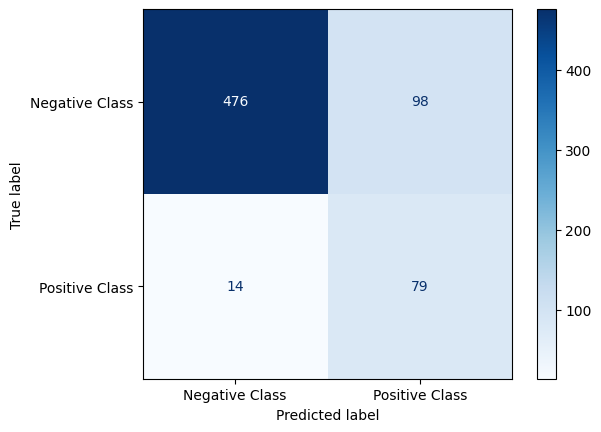

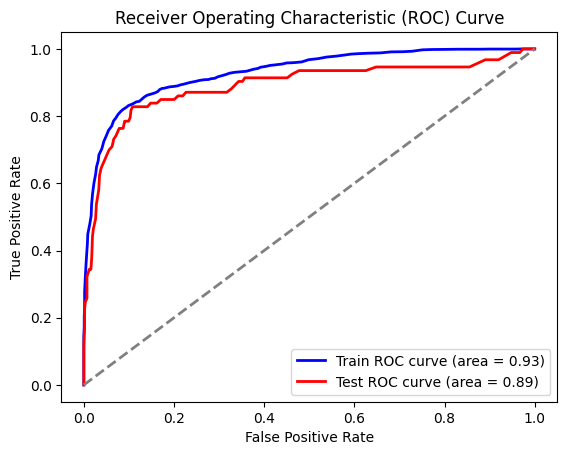

In [38]:
# Split the data into training and testing sets
X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split(X_new_train, y, test_size=0.2, random_state=42)

# Handle class imbalance using SMOTETomek
smote_tomek = SMOTE(random_state=42)
X_train_resample_knn, y_train_resample_knn = smote_tomek.fit_resample(X_train_knn, y_train_knn)

# Display the class distribution after applying SMOTETomek
# print("Class distribution after SMOTETomek:")
# print(y_train_resample_knn.value_counts())



# Initialize the K-Nearest Neighbors (KNN) classifier with specified hyperparameters
knn = KNeighborsClassifier(
    algorithm='auto',  # Algorithm used for finding nearest neighbors
    leaf_size=25,  # Leaf size for tree-based algorithms
    metric='minkowski',  # Distance metric used for neighbors calculation
    n_neighbors=110,  # Number of neighbors to consider
    p=1,  # Use Manhattan distance if p=1, Euclidean distance if p=2
    weights='uniform'  # Weight points by the inverse of their distance
)

# Fit the KNN model on the resampled training data
knn.fit(X_train_resample_knn, y_train_resample_knn)

# Define the parameter grid for hyperparameter optimization
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 15],  # Different values for the number of neighbors
    'weights': ['uniform', 'distance'],  # Weight points uniformly or by distance
    'p': [1, 2],  # Test Manhattan and Euclidean distances
    'leaf_size': [20, 30, 40],  # Different leaf sizes for optimization
    'algorithm': ['auto', 'ball_tree', 'kd_tree']  # Algorithms for nearest neighbors search
}

# Uncomment the following lines to perform hyperparameter tuning with GridSearchCV
# grid_search = GridSearchCV(estimator=knn, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)
# grid_search.fit(X_train_resample_knn, y_train_resample_knn)

# # Display the best parameters found by GridSearchCV
# print("Best parameters: ", grid_search.best_params_)
# best_knn = grid_search.best_estimator_

# Make predictions on the test set
y_pred_knn = knn.predict(X_test_knn)
y_train_predict_proba_knn = knn.predict_proba(X_train_resample_knn)[:, 1]
roc_auc_score_train_knn = roc_auc_score(y_train_resample_knn, y_train_predict_proba_knn)
print("ROC AUC SCORE TRAIN", roc_auc_score_train_knn)
y_train_predict_knn = knn.predict(X_train_resample_knn)
classification_report_train_knn= classification_report(y_train_resample_knn, y_train_predict_knn)
 

#ROC curve for training data
fpr_train_knn, tpr_train_knn, _ = roc_curve(y_train_resample_knn, y_train_predict_proba_knn)
roc_auc_train_knn = auc(fpr_train_knn, tpr_train_knn)

# ROC curve for test data
fpr_test_knn, tpr_test_knn, _ = roc_curve(y_test_knn,  knn.predict_proba(X_test_knn)[:, 1])
roc_auc_test_knn = auc(fpr_test_knn, tpr_test_knn)



# Evaluate the model
accuracy_knn = accuracy_score(y_test_knn, y_pred_knn)  # Compute accuracy score
roc_auc_knn = roc_auc_score(y_test_knn, knn.predict_proba(X_test_knn)[:, 1])  # Compute ROC AUC score
conf_matrix_knn = confusion_matrix(y_test_knn, y_pred_knn)  # Generate the confusion matrix

# Display the confusion matrix
disp = ConfusionMatrixDisplay(
    confusion_matrix=conf_matrix_knn, 
    display_labels=["Negative Class", "Positive Class"]
)
disp.plot(cmap="Blues")  # Use a blue colormap for the plot

# Generate the classification report
class_report_knn = classification_report(y_test_knn, y_pred_knn)

# Display the evaluation metrics
print(f"Accuracy: {accuracy_knn:.2f}")  # Print accuracy with two decimal places
print(f"ROC AUC: {roc_auc_knn:.2f}")  # Print ROC AUC score with two decimal places
print("Confusion Matrix:")
print(conf_matrix_knn)  # Print the confusion matrix
print("Classification Report:")
print(class_report_knn)# Print the classification report
print("Classification Report (Train):")
print(classification_report_train_knn)
# Plot ROC curve
plt.figure()
plt.plot(fpr_train_knn, tpr_train_knn, color='blue', lw=2, label=f'Train ROC curve (area = {roc_auc_train_knn:.2f})')
plt.plot(fpr_test_knn, tpr_test_knn, color='red', lw=2, label=f'Test ROC curve (area = {roc_auc_test_knn:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<h2 style="color:green">4.SVM</h2>

<div style="font-family: 'Segoe UI', Tahoma, sans-serif; line-height: 1.8; color: #2c3e50; padding: 30px; border: 1px solid #e0e0e0; border-radius: 12px; background-color: #f9fcff; max-width: 1050px; margin: 20px auto; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);margin-left:50px">

  <h2 style="text-align: center; color: #2c3e50; margin-bottom: 20px;">🖇️ Support Vector Machines (SVM)</h2>

  <div style="margin-bottom: 20px;">
    <strong style="color: #007acc;">1. 🔧 Kernel Trick:</strong>
    <ul style="margin-top: 10px; padding-left: 20px;">
      <li><strong>Linear:</strong> For linearly separable data.</li>
      <li><strong>Polynomial:</strong> For data that can be separated by a polynomial curve.</li>
      <li><strong>Radial Basis Function (RBF):</strong> Suitable for data that is not linearly separable.</li>
      <li><strong>Sigmoid:</strong> Mimics the behavior of neural networks.</li>
    </ul>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #007acc;">2. ⚖️ Regularization Parameter (<code>C</code>):</strong>
    <span>Controls the trade-off between achieving a low error on the training data and maintaining a simple decision boundary. A higher <code>C</code> value allows less error but risks overfitting.</span>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #007acc;">3. 🔬 Gamma:</strong>
    <span>A kernel coefficient for RBF, polynomial, and sigmoid kernels. It determines the influence of a single training example. Low values indicate a far-reaching influence, while high values make the influence local.</span>
  </div>

  <div>
    <strong style="color: #007acc;">4. 🧮 Degree (for Polynomial Kernel):</strong>
    <span>Used when the polynomial kernel is chosen. It determines the degree of the polynomial used in the kernel function.</span>
  </div>

</div>


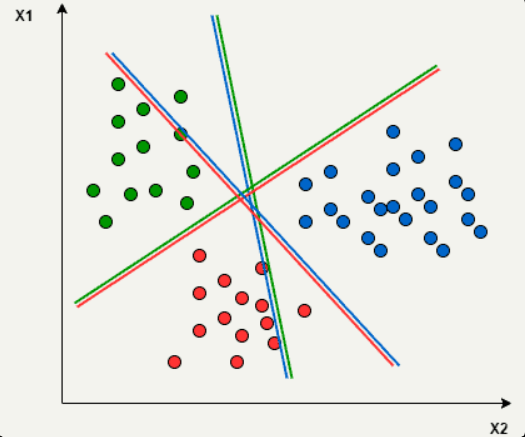

Accuracy: 0.9385307346326837

Classification report:
               precision    recall  f1-score   support

         0.0       0.95      0.98      0.96       574
         1.0       0.87      0.66      0.75        93

    accuracy                           0.94       667
   macro avg       0.91      0.82      0.86       667
weighted avg       0.94      0.94      0.93       667

Classification Report (Train):
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      2276
         1.0       0.98      0.87      0.92       390

    accuracy                           0.98      2666
   macro avg       0.98      0.93      0.96      2666
weighted avg       0.98      0.98      0.98      2666



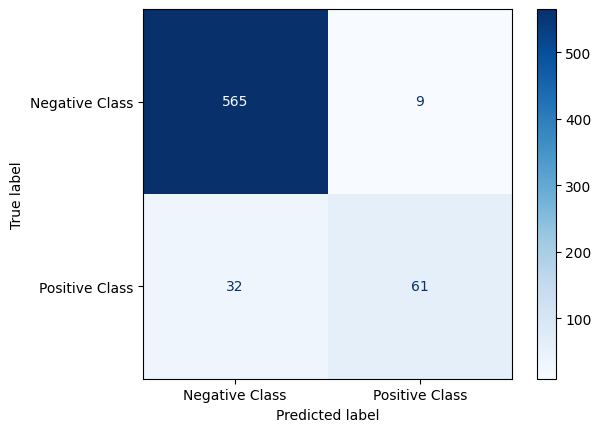

In [39]:
# Split the dataset into training and testing sets
X_train_svm, X_test_svm, y_train_svm, y_test_svm = train_test_split(X_new_train, y, test_size=0.2, random_state=42)

# Handle class imbalance using SMOTE (Synthetic Minority Oversampling Technique)
# smote_svm = SMOTETomek(random_state=42)
# X_res, y_res = smote_svm.fit_resample(X_train_svm, y_train_svm)

# Initialize the Support Vector Machine (SVM) model with specified hyperparameters
svm_model = SVC(
    C=165,  # Regularization parameter
    degree=3,  # Degree of the polynomial kernel (only relevant for 'poly' kernel)
    gamma=1,  # Kernel coefficient
    kernel='poly'  # Use polynomial kernel
)

# Train the SVM model on the resampled training data
svm_model.fit(X_train_svm, y_train_svm)

# Define the hyperparameter grid for GridSearchCV
param_grid = {
    'C': [1, 10, 100],  # Regularization strength
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],  # Kernel types
    'gamma': [0.01, 0.1, 1, 'scale', 'auto'],  # Kernel coefficient for 'rbf', 'poly', and 'sigmoid'
    'degree': [2, 3, 4, 5]  # Degree of polynomial kernel
}

# # Configure GridSearchCV for hyperparameter optimization
# grid_search = GridSearchCV(
#     estimator=svm_model,  # SVM model to tune
#     param_grid=param_grid,  # Hyperparameter grid
#     cv=5,  # 5-fold cross-validation
#     scoring='accuracy',  # Scoring metric
#     verbose=1,  # Verbosity level for progress updates
#     n_jobs=-1  # Use all available processors
# )

# # Perform the hyperparameter search
# grid_search.fit(X_res, y_res)

# # Display the best hyperparameters found by GridSearchCV
# print("Best hyperparameters found:", grid_search.best_params_)

# Make predictions on the test set using the trained SVM model
y_pred_svm = svm_model.predict(X_test_svm)
y_train_predict_SVM= svm_model.predict(X_train_svm)
classification_report_train_SVM = classification_report(y_train_svm, y_train_predict_SVM)


# Evaluate the performance of the model
accuracy_svm = accuracy_score(y_test_svm, y_pred_svm)  # Compute accuracy score
matrix_svm = confusion_matrix(y_test_svm, y_pred_svm) # Generate the confusion matrix
class_report_svm=classification_report(y_test_svm, y_pred_svm)

# Display evaluation results
print("Accuracy:", accuracy_svm)
print("\nClassification report:\n",class_report_svm)
print("Classification Report (Train):")
print(classification_report_train_SVM)

# Visualize the confusion matrix
disp = ConfusionMatrixDisplay(
    confusion_matrix=matrix_svm,
    display_labels=["Negative Class", "Positive Class"]  # Class labels
)
disp.plot(cmap="Blues")  # Use a blue colormap for the plot


<h2 style="color:green">5.Random Forest</h2>

<div style="font-family: 'Segoe UI', Tahoma, sans-serif; line-height: 1.8; color: #2c3e50; padding: 30px; border: 1px solid #eaeaea; border-radius: 12px; background-color: #f4f7fb; max-width: 1050px; margin: 20px auto; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.1);margin-left:10px;">

  <h2 style="text-align: center; color: #34495e; margin-bottom: 20px;">🌳 Random Forest Hyperparameters</h2>

  <div style="margin-bottom: 15px;">
    <strong style="color: #2980b9;">🔢 n_estimators:</strong>  
    <span>The number of trees in the forest. A higher number generally improves performance but increases computation time.</span>
  </div>

  <div style="margin-bottom: 15px;">
    <strong style="color: #2980b9;">📏 max_depth:</strong>  
    <span>The maximum depth of each tree. Limiting depth prevents overfitting.</span>
  </div>

  <div style="margin-bottom: 15px;">
    <strong style="color: #2980b9;">🍃 min_samples_leaf:</strong>  
    <span>The minimum number of samples required at each leaf node. Helps control overfitting by ensuring sufficient data at each leaf.</span>
  </div>

  <div style="margin-bottom: 15px;">
    <strong style="color: #2980b9;">✂️ min_samples_split:</strong>  
    <span>The minimum number of samples required to split an internal node. Controls how early the tree splits and prevents overfitting.</span>
  </div>

  <div style="margin-bottom: 15px;">
    <strong style="color: #2980b9;">🍂 max_leaf_nodes:</strong>  
    <span>The maximum number of leaf nodes in each tree, helping to control tree complexity.</span>
  </div>

  <div style="margin-bottom: 15px;">
    <strong style="color: #2980b9;">🔍 max_features:</strong>  
    <span>The number of features to consider when making a split. Options like <code>'sqrt'</code> or <code>'log2'</code> introduce randomness in feature selection.</span>
  </div>

  <div style="margin-bottom: 15px;">
    <strong style="color: #2980b9;">📦 bootstrap:</strong>  
    <span>Determines whether to use bootstrap samples when building trees. Setting it to <code>True</code> means each tree gets its data from a random subset of the training set.</span>
  </div>

  <div>
    <strong style="color: #2980b9;">⚙️ Grid Search:</strong>  
    <span><code>GridSearchCV</code> is used to tune hyperparameters by testing a range of values. Cross-validation (CV) evaluates performance for different hyperparameter combinations.</span>
  </div>

</div>


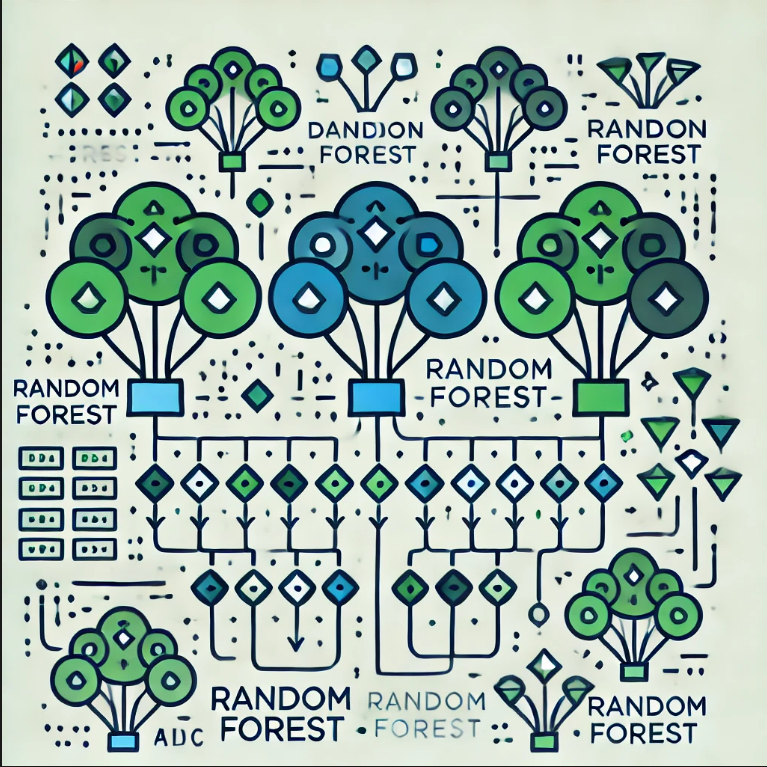

C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


Accuracy: 0.9505
Confusion Matrix:
Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       574
         1.0       0.83      0.82      0.82        93

    accuracy                           0.95       667
   macro avg       0.90      0.89      0.90       667
weighted avg       0.95      0.95      0.95       667

Classification Report (Train):
              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91      2276
         1.0       0.95      0.86      0.90      2276

    accuracy                           0.91      4552
   macro avg       0.91      0.91      0.91      4552
weighted avg       0.91      0.91      0.91      4552

ROC AUC SCORE TRAIN 0.9424775335818705
ROC AUC Score: 0.9096324603799033


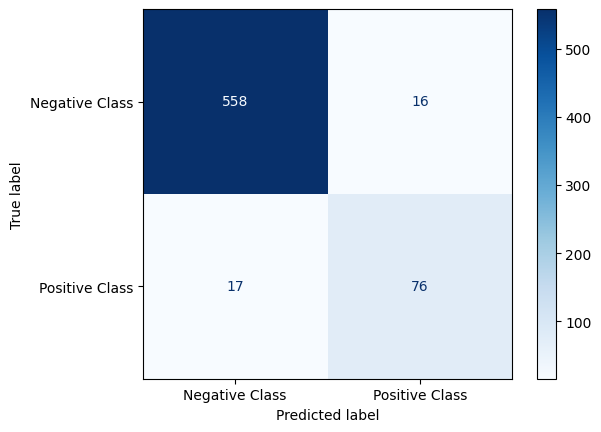

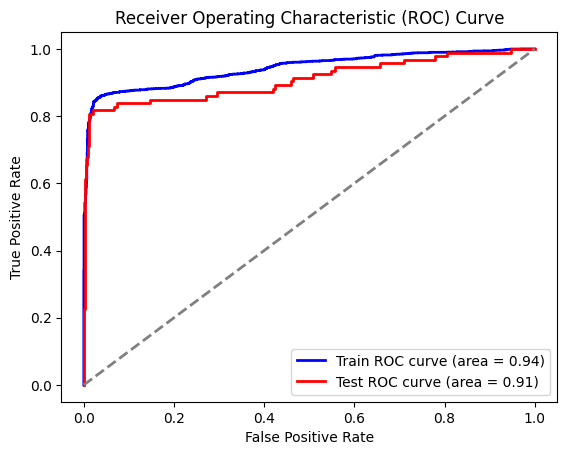

In [40]:
# Split the data into training and testing sets
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_new_train, y, test_size=0.2, random_state=42)

# Apply SMOTE to handle class imbalance in the training data
smote_rf = SMOTE(random_state=42)
X_train_resample_rf, y_train_resample_rf = smote_rf.fit_resample(X_train_rf, y_train_rf)

# Initialize the Random Forest classifier with specified hyperparameters
model_rf = RandomForestClassifier(
    bootstrap=True,  # Use bootstrap sampling for training
    max_depth=5,  # Maximum depth of the trees
    min_samples_leaf=5,  # Minimum number of samples required at a leaf node
    min_samples_split=20,  # Minimum number of samples required to split an internal node
    max_leaf_nodes=50,  # Maximum number of leaf nodes
    n_estimators=50,  # Number of trees in the forest
    min_impurity_decrease=0.001,  # Minimum impurity decrease required for a split
    random_state=42  # Random state for reproducibility
)

# Define the grid of hyperparameters for GridSearchCV
param_grid_rf = {
    'n_estimators': [50, 100],  # Number of trees to test
    'max_depth': [3, 5, 7, 10],  # Different tree depths to test
    'min_samples_leaf': [1, 5, 10],  # Minimum samples per leaf to test
    'min_samples_split': [2, 5, 10, 20],  # Minimum samples to split a node
    'max_features': ['sqrt', 'log2'],  # Number of features considered for the best split
    'bootstrap': [True],  # Use bootstrap samples for building trees
}

# Perform grid search to find the best hyperparameters
grid_search_rf = GridSearchCV(
    estimator=model_rf,  # Base Random Forest model
    param_grid=param_grid_rf,  # Parameter grid to search
    cv=3,  # 3-fold cross-validation
    scoring='recall',  # Optimize the model for recall
    verbose=1,  # Display progress of the search
    n_jobs=-1  # Use all available processors
)
# grid_search_rf.fit(X_train_resample_rf, y_train_resample_rf)

# # Display the best parameters found by GridSearchCV
# print("Best parameters:", grid_search_rf.best_params_)

# Train the Random Forest model on the resampled training data
model_rf.fit(X_train_resample_rf, y_train_resample_rf)

# Get the best model from GridSearchCV
# best_model_rf = grid_search_rf.best_estimator_

# Predict the test set outcomes
y_pred_rf = model_rf.predict(X_test_rf)
y_train_predict_rf = model_rf.predict(X_train_resample_rf)
y_train_predict_proba_rf = model_rf.predict_proba(X_train_resample_rf)[:, 1]
classification_report_train_rf = classification_report(y_train_resample_rf, y_train_predict_rf)

# ROC curve for training data
fpr_train_rf, tpr_train_rf, _ = roc_curve(y_train_resample_rf, y_train_predict_proba_rf)
roc_auc_train_rf = auc(fpr_train_rf, tpr_train_rf)

# ROC curve for test data
fpr_test_rf, tpr_test_rf, _ = roc_curve(y_test_rf, model_rf.predict_proba(X_test_rf)[:, 1])
roc_auc_test_rf = auc(fpr_test_rf, tpr_test_rf)





# Evaluate the model's accuracy
accuracy_rf = accuracy_score(y_test_rf, y_pred_rf)
print(f"Accuracy: {accuracy_rf:.4f}")  # Print accuracy with four decimal places

# Display the confusion matrix
print("Confusion Matrix:")
conf_matrix_rf = confusion_matrix(y_test_rf, y_pred_rf)  # Generate the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_rf, display_labels=["Negative Class", "Positive Class"])
disp.plot(cmap="Blues")  # Use a blue colormap for the confusion matrix plot

# Print classification report
print("Classification Report:")
class_report_rf=classification_report(y_test_rf, y_pred_rf)
print(class_report_rf)  # Detailed classification metrics
print("Classification Report (Train):")
print(classification_report_train_rf)

# Calculate and display the ROC AUC score
roc_score_rf = roc_auc_score(y_test_rf, model_rf.predict_proba(X_test_rf)[:, 1])  # Compute AUC-ROC score

roc_auc_score_train_rf = roc_auc_score(y_train_resample_rf, y_train_predict_proba_rf)
print("ROC AUC SCORE TRAIN", roc_auc_score_train_rf)
print("ROC AUC Score:", roc_score_rf)

# Plot ROC curve
plt.figure()
plt.plot(fpr_train_rf, tpr_train_rf, color='blue', lw=2, label=f'Train ROC curve (area = {roc_auc_train_rf:.2f})')
plt.plot(fpr_test_rf, tpr_test_rf, color='red', lw=2, label=f'Test ROC curve (area = {roc_auc_test_rf:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<h2 style="color:green">7.Boosting</h2>

<div style="font-family: 'Segoe UI', Tahoma, sans-serif; line-height: 1.8; color: #2c3e50; padding: 30px; border: 1px solid #e0e0e0; border-radius: 12px; background-color: #fffefa; max-width: 1050px; margin: 20px auto; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);margin-left:10px;">

  <h2 style="text-align: center; color: #e67e22; margin-bottom: 20px;">🚀 AdaBoost Overview</h2>

  <div style="margin-bottom: 20px;">
    <strong style="color: #d35400;">1. 🌳 Base Estimator:</strong>
    <p style="margin-top: 10px;">Decision Trees are typically used as weak learners in AdaBoost. These trees are shallow (e.g., <code>max_depth=3</code>) to ensure they remain weak and can be improved through boosting. The base estimator in AdaBoost is often a <code>DecisionTreeClassifier</code>.</p>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #d35400;">2. 🔄 Boosting Process:</strong>
    <p style="margin-top: 10px;">AdaBoost works by fitting a sequence of models, with each model correcting the errors made by the previous one. This iterative process focuses on the hardest-to-classify samples.</p>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #d35400;">3. 🔢 n_estimators:</strong>
    <p style="margin-top: 10px;">Specifies the number of boosting iterations (or rounds) where new weak learners (e.g., trees) are added. Increasing this value can improve performance but might increase computation time.</p>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #d35400;">4. ⚖️ learning_rate:</strong>
    <p style="margin-top: 10px;">A scaling factor applied to the predictions of each weak learner. It controls the contribution of each learner to the final prediction.</p>
  </div>

  <div style="margin-bottom: 20px;">
    <strong style="color: #d35400;">5. 🛠️ algorithm:</strong>
    <p style="margin-top: 10px;">Two algorithms are available in AdaBoost:</p>
    <ul style="padding-left: 20px;">
      <li><strong>SAMME:</strong> Uses discrete class labels for boosting.</li>
      <li><strong>SAMME.R:</strong> (Real AdaBoost) Uses real-valued predictions and is often preferred for its improved performance.</li>
    </ul>
  </div>

  <div>
    <strong style="color: #d35400;">6. 🧪 SMOTEENN:</strong>
    <p style="margin-top: 10px;">A combination of <strong>SMOTE</strong> (Synthetic Minority Over-sampling Technique) and <strong>ENN</strong> (Edited Nearest Neighbors). It handles class imbalance by generating synthetic samples for the minority class and cleaning noisy data using ENN.</p>
  </div>

</div>


C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(
C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:514: Fut

ROC AUC SCORE TRAIN 0.95547728494167
Accuracy: 0.9580
Confusion Matrix:
Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98       574
         1.0       0.90      0.78      0.84        93

    accuracy                           0.96       667
   macro avg       0.93      0.89      0.91       667
weighted avg       0.96      0.96      0.96       667

roc_auc_score (optimized): 0.8997883181596793


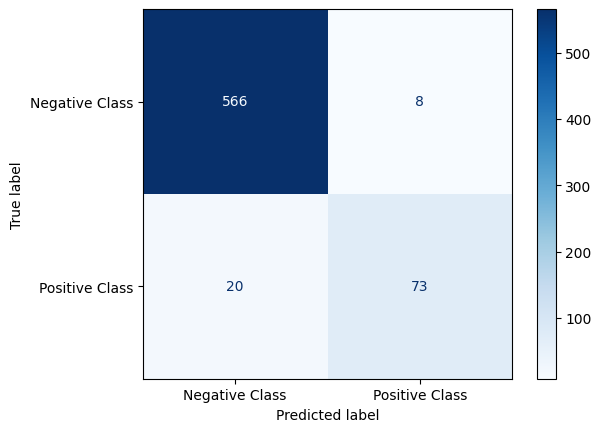

In [41]:
# Split the dataset into training and testing sets
X_train_ABC, X_test_ABC, y_train_ABC, y_test_ABC = train_test_split(X_new_train, y, test_size=0.2, random_state=42)

# Handle class imbalance using SMOTEENN (combination of SMOTE and Edited Nearest Neighbors)
smote = SMOTE(random_state=42)
X_train_resample_ABC, y_train_resample_ABC = smote.fit_resample(X_train_ABC, y_train_ABC)

# Initialize AdaBoostClassifier with a DecisionTreeClassifier as the base estimator
model_ABC = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=5),  # Decision tree base model
    random_state=42,  # Seed for random number generator
    n_estimators=50,  # Number of boosting iterations
    learning_rate=0.017,  # Learning rate for the model
    algorithm='SAMME'  # The algorithm used for boosting
)

# Train the AdaBoost model on the resampled training data
model_ABC.fit(X_train_resample_ABC, y_train_resample_ABC)

# Define the hyperparameter grid for GridSearchCV to optimize AdaBoost model
param_grid = {
    'n_estimators': [50, 100, 200, 300],  # Number of boosting rounds (trees)
    'learning_rate': [0.01, 0.1, 0.5, 1.0, 1.5],  # Step size for boosting
    'algorithm': ['SAMME', 'SAMME.R'],  # Type of boosting algorithm
    'estimator': [
        # Different configurations of DecisionTreeClassifier as the base estimator
        DecisionTreeClassifier(max_depth=3, min_samples_split=10, min_samples_leaf=5, criterion='gini'),
        DecisionTreeClassifier(max_depth=3, min_samples_split=15, min_samples_leaf=10, criterion='entropy')
    ]
}

# Configure GridSearchCV for hyperparameter optimization
# grid_search = GridSearchCV(estimator=model_ABC, param_grid=param_grid, cv=5, scoring='roc_auc', n_jobs=-1, verbose=1)

# # # Perform the grid search to find the best hyperparameters
# grid_search.fit(X_train_resample_ABC, y_train_resample_ABC)

# # # Display the best hyperparameters found by GridSearchCV
# print("Best hyperparameters:", grid_search.best_params_)

# Make predictions on the test set using the trained AdaBoost model
y_pred_ABC = model_ABC.predict(X_test_ABC)
y_train_predict_proba_ABC = model_ABC.predict_proba(X_train_resample_ABC)[:, 1]
roc_auc_score_train_ABC = roc_auc_score(y_train_resample_ABC, y_train_predict_proba_ABC)
print("ROC AUC SCORE TRAIN", roc_auc_score_train_ABC)

# Calculate the accuracy of the model
accuracy_ABC = accuracy_score(y_test_ABC, y_pred_ABC)
print(f"Accuracy: {accuracy_ABC:.4f}")

# Generate and display the confusion matrix
print("Confusion Matrix:")
conf_matrix_abc = confusion_matrix(y_test_ABC, y_pred_ABC)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_abc, display_labels=["Negative Class", "Positive Class"])
disp.plot(cmap="Blues")

# Print the classification report (precision, recall, f1-score)
print("Classification Report:")
class_report_ABC=classification_report(y_test_ABC, y_pred_ABC)
print(class_report_ABC)

# Calculate the ROC AUC score to evaluate model performance
roc_score_ABC = roc_auc_score(y_test_ABC, model_ABC.predict_proba(X_test_ABC)[:, 1])
print("roc_auc_score (optimized):", roc_score_ABC)


> **Gradient Boosting Machine (GBM) is an ensemble learning method that builds strong classifiers by combining the predictions of multiple weak models (usually decision trees). It sequentially fits trees to the residual errors made by previous trees, improving the model's accuracy in a step-by-step manner.**

* **min_impurity_decrease:** The minimum decrease in impurity required to split a node, used to control overfitting by preventing the growth of unnecessary branches.

C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


ROC AUC SCORE TRAIN 0.9538368001396091
accuracy_gbm =  0.95952023988006
conf_matrix_gbm =  [[565   9]
 [ 18  75]]
roc_auc_score_gbm =  0.9033756697013975
Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      0.98      0.98       574
         1.0       0.89      0.81      0.85        93

    accuracy                           0.96       667
   macro avg       0.93      0.90      0.91       667
weighted avg       0.96      0.96      0.96       667

Classification Report (Train):
              precision    recall  f1-score   support

         0.0       0.87      0.98      0.92      2276
         1.0       0.97      0.86      0.91      2276

    accuracy                           0.92      4552
   macro avg       0.92      0.92      0.92      4552
weighted avg       0.92      0.92      0.92      4552



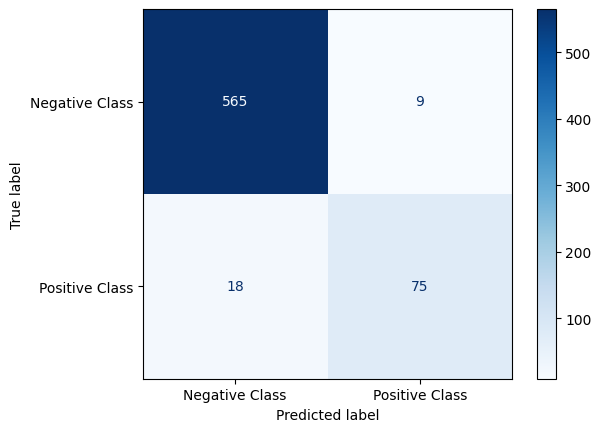

In [42]:
# Split the dataset into training and testing sets
X_train_gbm, X_test_gbm, y_train_gbm, y_test_gbm = train_test_split(X_new_train, y, test_size=0.2, random_state=42)

# Handle class imbalance using SMOTE (Synthetic Minority Over-sampling Technique)
smote_gbm = SMOTE(random_state=42)
X_train_gbm_balanced, y_train_gbm_balanced = smote_gbm.fit_resample(X_train_gbm, y_train_gbm)

# Initialize the Gradient Boosting Model (GBM) with specified hyperparameters
gbm = GradientBoostingClassifier(
    n_estimators=17,  # Number of boosting stages (trees)
    learning_rate=0.088,  # Step size for each boosting step
    max_depth=4,  # Maximum depth of the trees
     
    random_state=42  # Seed for reproducibility
)

# Train the GBM model on the balanced training data
gbm.fit(X_train_gbm_balanced, y_train_gbm_balanced)

# Define the hyperparameter grid for GridSearchCV to optimize the GradientBoostingClassifier
param_grid = {
    'n_estimators': [50, 100, 150],  # Number of boosting rounds (trees)
    'learning_rate': [0.01, 0.05, 0.1],  # Learning rate for each boosting step
    'max_depth': [3, 5, 7],  # Maximum depth of the individual trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required to be a leaf node
}

# Perform grid search to find the best hyperparameters for the GBM
# grid_search = GridSearchCV(estimator=gbm, param_grid=param_grid, 
#                            cv=5, scoring='accuracy', verbose=1, n_jobs=-1)
# grid_search.fit(X_train, y_train)

# # Display the best hyperparameters found by GridSearchCV
# print("Best Parameters:", grid_search.best_params_)

# Make predictions on the test set using the trained GBM model
y_predict_gbm = gbm.predict(X_test_gbm)
y_predict_proba_gbm = gbm.predict_proba(X_test_gbm)[:, 1]  # Probabilities for the positive class

# Evaluate the model using accuracy, confusion matrix, and ROC AUC score
conf_matrix_gbm = confusion_matrix(y_test_gbm, y_predict_gbm)
accuracy_gbm = accuracy_score(y_test_gbm, y_predict_gbm)
roc_auc_score_gbm = roc_auc_score(y_test_gbm, y_predict_proba_gbm)
classification_report_gbm = classification_report(y_test_gbm, y_predict_gbm)
y_train_predict_proba_gbm = gbm.predict_proba(X_train_gbm_balanced)[:, 1]
roc_auc_score_train_gbm= roc_auc_score(y_train_gbm_balanced, y_train_predict_proba_gbm)
print("ROC AUC SCORE TRAIN", roc_auc_score_train_gbm)

# Print the evaluation results
print("accuracy_gbm = ", accuracy_gbm)
print("conf_matrix_gbm = ", conf_matrix_gbm)

# Display the confusion matrix as a heatmap
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_gbm, display_labels=["Negative Class", "Positive Class"])
disp.plot(cmap="Blues")

# Print the ROC AUC score
print("roc_auc_score_gbm = ", roc_auc_score_gbm)

# Print the classification report (precision, recall, f1-score)
print("Classification Report:")
print(classification_report_gbm)
y_train_predict_gbm= gbm.predict(X_train_gbm_balanced)
classification_report_train_gbm = classification_report(y_train_gbm_balanced, y_train_predict_gbm)
print("Classification Report (Train):")
print(classification_report_train_gbm)


# ROC curve for training data
fpr_train, tpr_train, _ = roc_curve(y_train_gbm_balanced, y_train_predict_proba_gbm)
roc_auc_train_gbm = auc(fpr_train, tpr_train)

# ROC curve for test data
fpr_test_gbm, tpr_test_gbm, _ = roc_curve(y_test_gbm, y_predict_proba_gbm)
roc_auc_test_gbm = auc(fpr_test_gbm, tpr_test_gbm)

# Plot ROC curve
# plt.figure()
# plt.plot(fpr_train, tpr_train, color='blue', lw=2, label=f'Train ROC curve (area = {roc_auc_train_gbm:.2f})')
# plt.plot(fpr_test, tpr_test, color='red', lw=2, label=f'Test ROC curve (area = {roc_auc_test_gbm:.2f})')
# plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver Operating Characteristic (ROC) Curve')
# plt.legend(loc='lower right')
# plt.show()



> **XGBoost (Extreme Gradient Boosting) is a powerful and efficient implementation of gradient boosting designed for performance and speed. It is widely used for both regression and classification tasks. XGBoost improves traditional gradient boosting by using advanced regularization techniques and more sophisticated training processes, leading to better accuracy and lower overfitting.**

* **objective:** Specifies the type of problem being solved. In this case, binary:logistic is used for binary classification (i.e., predicting a class with two outcomes).

C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
C:\Users\moham\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


ROC AUC SCORE TRAIN 0.9551001259047912
accuracy_xg =  0.965
conf_matrix_xg =  [[843  14]
 [ 21 122]]
roc_auc_score_xg =  0.926948780507707
Classification Report (Test):
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98       857
         1.0       0.90      0.85      0.87       143

    accuracy                           0.96      1000
   macro avg       0.94      0.92      0.93      1000
weighted avg       0.96      0.96      0.96      1000

Classification Report (Train):
              precision    recall  f1-score   support

         0.0       0.88      0.98      0.93      1993
         1.0       0.97      0.87      0.92      1993

    accuracy                           0.92      3986
   macro avg       0.93      0.92      0.92      3986
weighted avg       0.93      0.92      0.92      3986



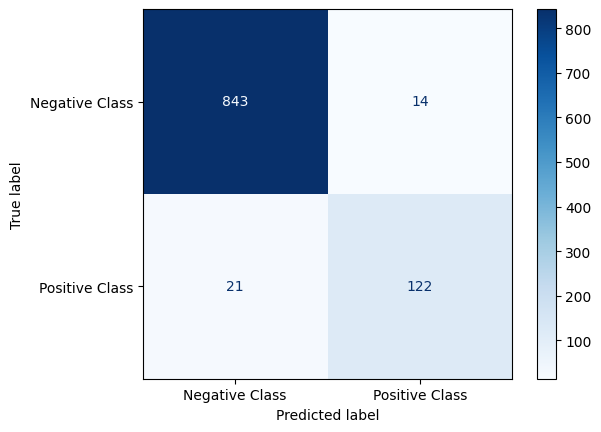

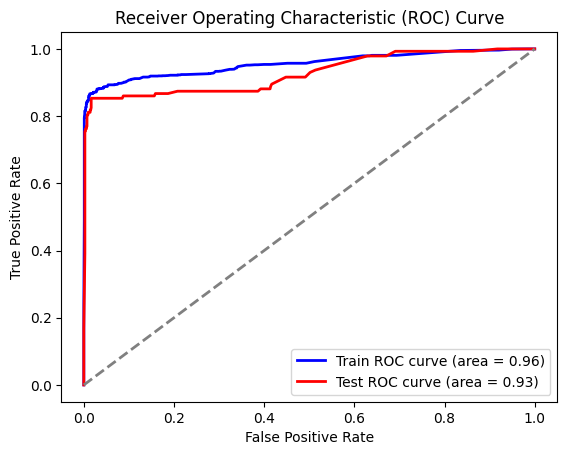

In [43]:
# Split the dataset into training and testing sets
X_train_XGBC, X_test_XGBC, y_train_XGBC, y_test_XGBC = train_test_split(X_new_train ,y, test_size=0.3, random_state=42)

# Handle class imbalance using SMOTE (Synthetic Minority Over-sampling Technique)
smote_xg = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote_xg.fit_resample(X_train_XGBC, y_train_XGBC)

# Initialize the XGBoost classifier with specified hyperparameters
XGBC = XGBClassifier(
    n_estimators=12,  # Number of boosting stages (trees)
    max_depth=5,  # Maximum depth of the trees
    learning_rate=0.15,  # Step size at each boosting iteration
    reg_lambda=10,  # L2 regularization
    reg_alpha=2,  # L1 regularization
    objective='binary:logistic'  # Logistic regression for binary classification
)

# Train the XGBoost model on the balanced training data
XGBC.fit(X_train_bal, y_train_bal)

# Make predictions on the test set using the trained XGBoost model
y_predict_xg = XGBC.predict(X_test_XGBC)
y_predict_proba_xg = XGBC.predict_proba(X_test_XGBC)[:, 1]  # Probabilities for the positive class
y_train_predict_proba_xg = XGBC.predict_proba(X_train_bal)[:, 1]
roc_auc_score_train_xg = roc_auc_score(y_train_bal, y_train_predict_proba_xg)
print("ROC AUC SCORE TRAIN", roc_auc_score_train_xg)

# Evaluate the model using accuracy, confusion matrix, and ROC AUC score
conf_matrix_xg = confusion_matrix(y_test_XGBC, y_predict_xg)
accuracy_xg = accuracy_score(y_test_XGBC, y_predict_xg)
roc_auc_score_xg = roc_auc_score(y_test_XGBC, y_predict_proba_xg)
classification_report_xg = classification_report(y_test_XGBC, y_predict_xg)

# Print the evaluation results
print("accuracy_xg = ", accuracy_xg)
print("conf_matrix_xg = ", conf_matrix_xg)

# Display the confusion matrix as a heatmap
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_xg, display_labels=["Negative Class", "Positive Class"])
disp.plot(cmap="Blues")

# Print the ROC AUC score for test set
print("roc_auc_score_xg = ", roc_auc_score_xg)

# Print the classification report for the test set (precision, recall, f1-score)
print("Classification Report (Test):")
print(classification_report_xg)

# Classification report for training data
y_train_predict_xg = XGBC.predict(X_train_bal)
classification_report_train_xg = classification_report(y_train_bal, y_train_predict_xg)
print("Classification Report (Train):")
print(classification_report_train_xg)


# ROC curve for training data
fpr_train, tpr_train, _ = roc_curve(y_train_bal, y_train_predict_proba_xg)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC curve for test data
fpr_test, tpr_test, _ = roc_curve(y_test_XGBC, y_predict_proba_xg)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curve
plt.figure()
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label=f'Train ROC curve (area = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, color='red', lw=2, label=f'Test ROC curve (area = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [44]:
model_prediction_churn = {
      "RandomForest": {
        "model": model_rf,
        "performance": {
            "accuracy":accuracy_rf,
            "roc_auc": roc_score_rf,
            "report": class_report_rf
        }
    },
   
    
    "adaBoosting":{
        "model": model_ABC,
        "performance": {
            "accuracy": accuracy_ABC,
            "roc_auc": roc_score_ABC,
            "report": classification_report_gbm
        }
    },
    "gbm":{
        "model": gbm,
        "performance": {
            "accuracy": accuracy_gbm,
            "roc_auc": roc_auc_score_gbm,
            "report": class_report_ABC
        }
    },
    "XGBC":{
        "model": XGBC,
        "performance": {
            "accuracy": accuracy_xg,
            "roc_auc": roc_auc_score_xg,
            "report": classification_report_xg
        }
    }
    
}
joblib.dump(model_prediction_churn, "model_prediction_churn.pkl")

['model_prediction_churn.pkl']

In [45]:
file_path = "model_ml.pkl"

#  Create a download link
FileLink(file_path)

C:\Users\moham\Downloads\model_ml.pkl